In [1]:
library(clusterProfiler)
library(ArchR)
addArchRThreads(threads = 1)
addArchRGenome("mm10")
library(clusterProfiler)
library(ArchR)
# library(Signac)
set.seed(1)
addArchRThreads(threads = 1)
addArchRGenome("mm10")
library(tidyverse)
library(here)
library(Seurat)
# library(gt)
library(ChIPseeker)
library(TxDb.Mmusculus.UCSC.mm10.knownGene)
txdb <- TxDb.Mmusculus.UCSC.mm10.knownGene
library(clusterProfiler)
library(ReactomePA)
library(DOSE)
#plot track
library(scATACutils)
library(dplyr)
library(readr)
library(ggplot2)
library(org.Mm.eg.db)
library(ggpubr)



clusterProfiler v4.6.0  For help: https://yulab-smu.top/biomedical-knowledge-mining-book/

If you use clusterProfiler in published research, please cite:
T Wu, E Hu, S Xu, M Chen, P Guo, Z Dai, T Feng, L Zhou, W Tang, L Zhan, X Fu, S Liu, X Bo, and G Yu. clusterProfiler 4.0: A universal enrichment tool for interpreting omics data. The Innovation. 2021, 2(3):100141


Attaching package: ‘clusterProfiler’


The following object is masked from ‘package:stats’:

    filter



                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
  

# Load data and snapatac umap

In [2]:
h5disableFileLocking()

In [3]:
Merged.proj2 <- readRDS(file= "./gonad_fil_somatic202112/Save-ArchR-Project.rds")
Merged.proj2@sampleColData$ArrowFiles <- c("/lustre/home/jasonliao/teaching_server/sex_differentiation/gonad_fil_somatic202112/ArrowFiles/TP15.arrow",
                                          "/lustre/home/jasonliao/teaching_server/sex_differentiation/gonad_fil_somatic202112/ArrowFiles/TP12.arrow",
                                          "/lustre/home/jasonliao/teaching_server/sex_differentiation/gonad_fil_somatic202112/ArrowFiles/TP13.arrow",
                                          "/lustre/home/jasonliao/teaching_server/sex_differentiation/gonad_fil_somatic202112/ArrowFiles/TP14.arrow")# getAvailableMatrices(Merged.proj2)
Merged.proj2 <- addImputeWeights(Merged.proj2,k=15,ka=4,td=3,sampleCells = 5000,reducedDims = "IterativeLSI")

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-72476e3f427f-Date-2023-04-21_Time-22-43-43.log
If there is an issue, please report to github with logFile!

2023-04-21 22:43:44 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.



In [ ]:
snap.meta <- readRDS(file="snapatac/gonad_fil.4sampls_snapatac.metadata.rds")
rownames(snap.meta) <- paste(substring(rownames(snap.meta),1,5),tolower(substring(rownames(snap.meta),6,32)),substring(rownames(snap.meta),33,55),sep="")
library(tidyverse)
snap.reduceddim <- snap.meta %>% dplyr::select(28:41)
colnames(snap.reduceddim) <- paste("LSI",1:14,sep="")

snapumap <- Merged.proj2@cellColData %>% as.data.frame %>% dplyr::select(umap.1,umap.2)
Merged.proj2@embeddings@listData$UMAP$df$"IterativeLSI#UMAP_Dimension_1" <- snapumap$umap.1 
Merged.proj2@embeddings@listData$UMAP$df$"IterativeLSI#UMAP_Dimension_2" <- snapumap$umap.2 

Merged.proj2@reducedDims[["IterativeLSI"]][[1]] <- snap.reduceddim %>% as.matrix()

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-38c648aff98d-Date-2023-04-14_Time-17-49-04.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 

2 

3 



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-38c648aff98d-Date-2023-04-14_Time-17-49-04.log



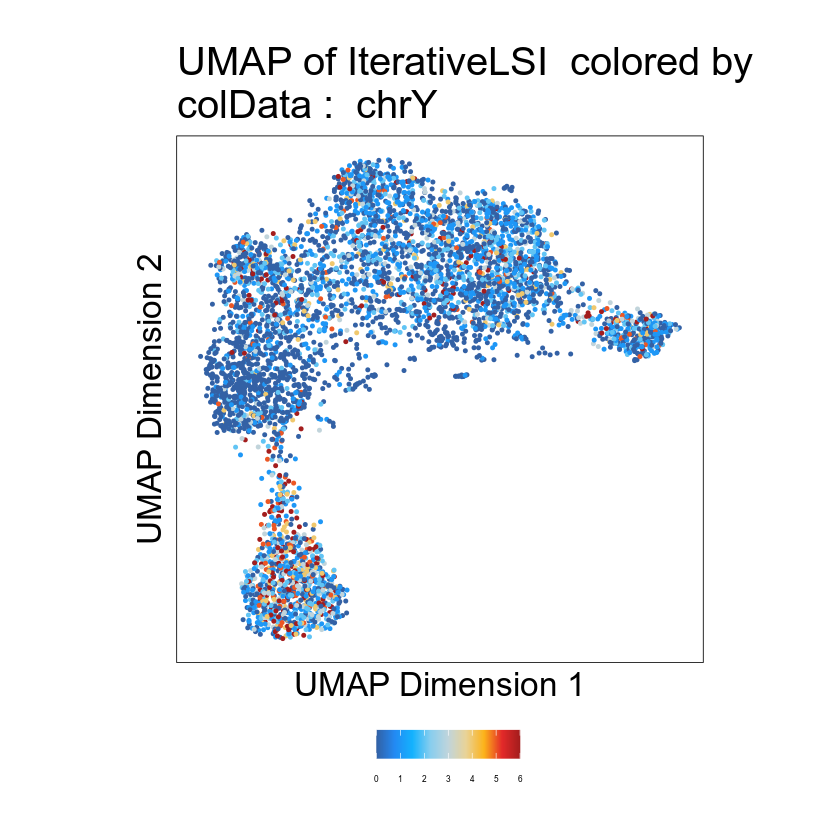

$chrY

$cluster

$Sample


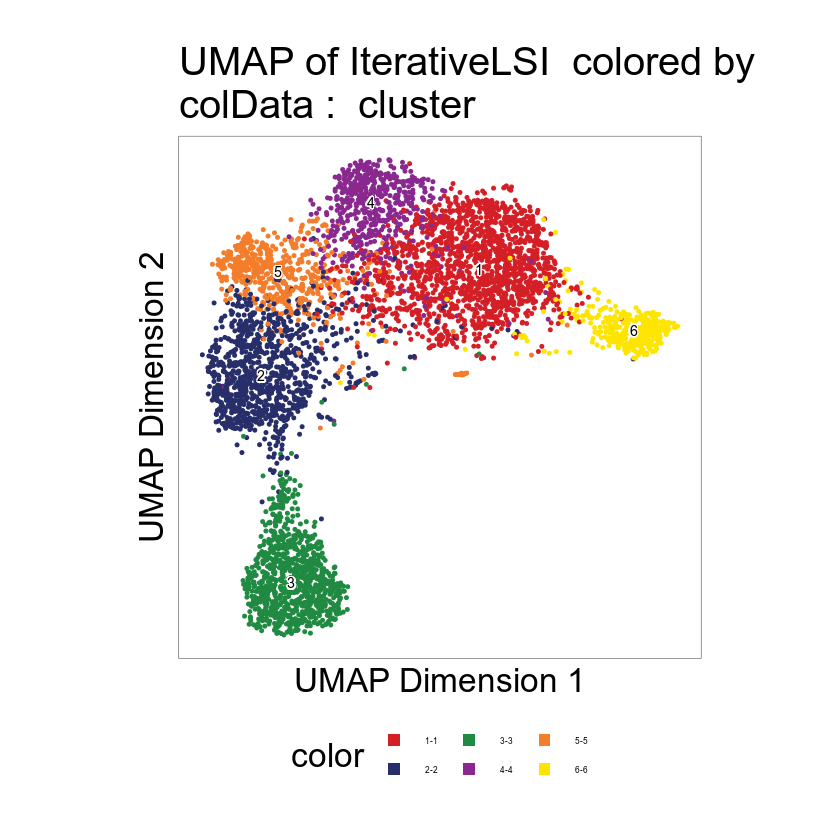

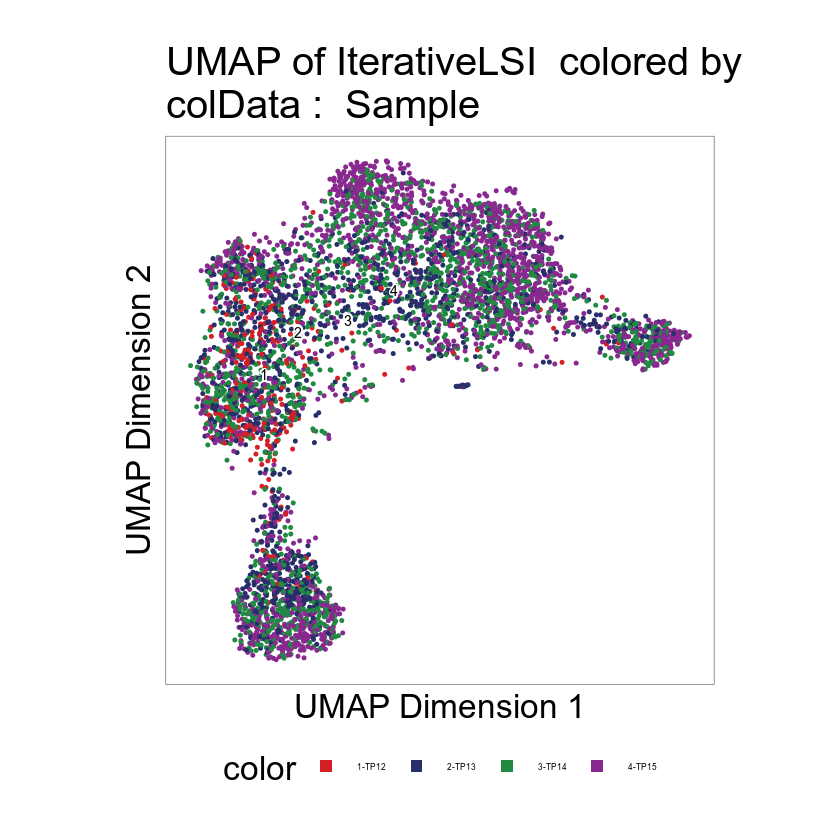

In [4]:
p <- plotEmbedding(ArchRProj = Merged.proj2,embedding = "UMAP", colorBy ="cellColData", 
              name = c("chrY", "cluster", "Sample"),
              keepAxis = FALSE,
              plotAs = "points",
                 quantCut = c(0, 0.95),
              size=0.75,
       baseSize = 20)
p

In [5]:
seRNA <- readRDS("./iscience.data/2022.somatic.iscience.somatic.scRNA.rds")

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 12611
Number of edges: 392974

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9479
Number of communities: 6
Elapsed time: 1 seconds


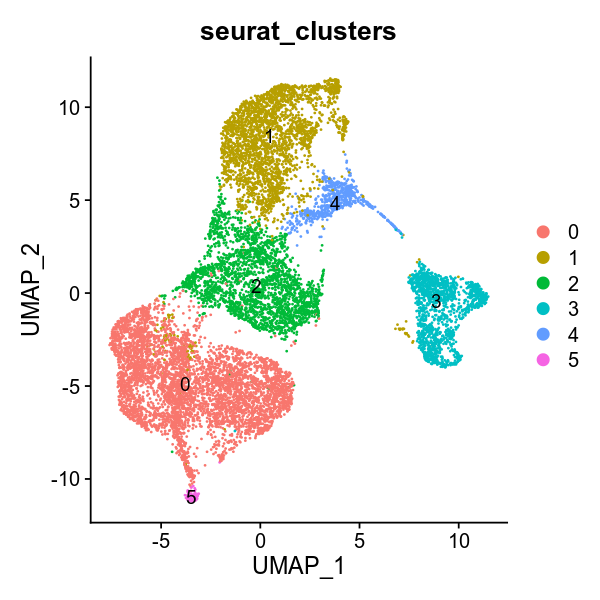

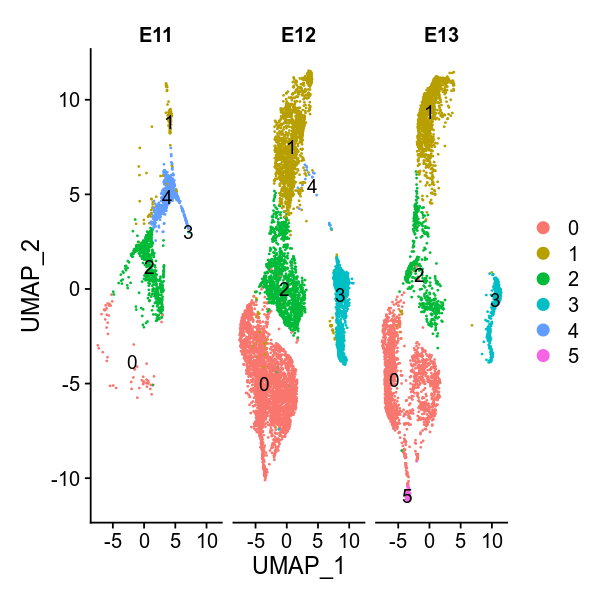

In [6]:
options(repr.plot.width=5,repr.plot.height=5)
seRNA <- FindClusters(seRNA, resolution = 0.15)
DimPlot(seRNA, reduction = "umap",  label = TRUE,group.by = "seurat_clusters")
DimPlot(seRNA, reduction = "umap",  label = TRUE,split.by = "time",ncol=3)

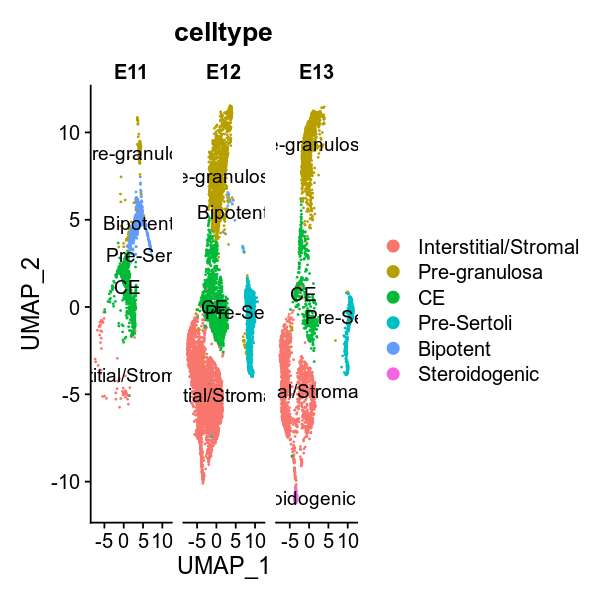

In [7]:
seRNA=RenameIdents(seRNA,"0" = "Interstitial/Stromal", 
                      "1" = "Pre-granulosa",
                     "2" = "CE",
                     "3"= "Pre-Sertoli",
                     "4"= "Bipotent",
                      "5" = "Steroidogenic")
seRNA@meta.data$celltype <- Idents(seRNA)
DimPlot(seRNA, reduction = "umap",  label = TRUE,split.by = "time",ncol=3,group.by = "celltype")

In [166]:
pdf("./2022Figure/iscience.somatic.UMAP.pdf",height=6,width=8)
DimPlot(seRNA, reduction = "umap",group.by = "celltype")
dev.off()

png 
  2

In [53]:
pdf("./2022Figure/iscience.scRNA.umap.pdf",height =10,width=10)
DimPlot(seRNA,group.by = "celltype")
dev.off()

png 
  2

In [146]:
## Integration without harmony 
Merged.proj2 <- addGeneIntegrationMatrix(
    ArchRProj = Merged.proj2, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "IterativeLSI",
    seRNA = seRNA,
     nGenes = 2000,
    addToArrow = TRUE,
    groupATAC = "cluster",
    groupRNA = "celltype",
    nameCell = "predictedCell_Un_woharmony",
    nameGroup = "predictedGroup_Un_woharmony",
    nameScore = "predictedScore_Un_woharmony",
    force = TRUE,
    plotUMAP = TRUE
)

ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-cea4a9627b7-Date-2022-03-22_Time-14-12-42.log
If there is an issue, please report to github with logFile!

2022-03-22 14:12:43 : Running Seurat's Integration Stuart* et al 2019, 0.005 mins elapsed.

2022-03-22 14:12:43 : Checking ATAC Input, 0.007 mins elapsed.

2022-03-22 14:12:43 : Checking RNA Input, 0.014 mins elapsed.

2022-03-22 14:12:47 : Found 17556 overlapping gene names from gene scores and rna matrix!, 0.082 mins elapsed.

2022-03-22 14:12:47 : Creating Integration Blocks, 0.082 mins elapsed.

2022-03-22 14:12:47 : Prepping Interation Data, 0.084 mins elapsed.

Filtering 20 dims correlated > 0.75 to log10(depth + 1)

2022-03-22 14:12:48 : Computing Integration in 1 Integration Blocks!, 0 mins elapsed.

2022-03-22 14:12:48 : Block (1 of 1) : Computing Integration, 0 mins elapsed.

2022-03-22 14:12:53 : Block (1 of 1) : Identifying Variable Genes, 0.088 mins elapsed.

2022-03-22 14:13:01 : Block (1 of 1) : Getting Gen

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-38c65aaf5a48-Date-2023-04-14_Time-17-52-43.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 

2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-38c65aaf5a48-Date-2023-04-14_Time-17-52-43.log



$predictedGroup_Un_woharmony

$predictedScore_Un_woharmony


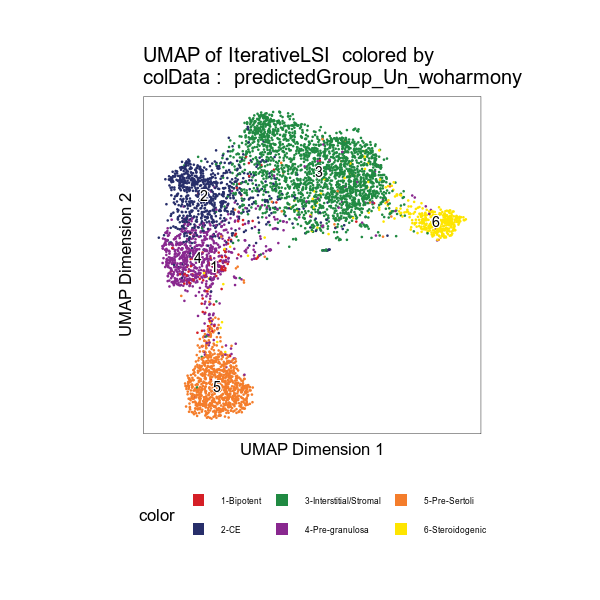

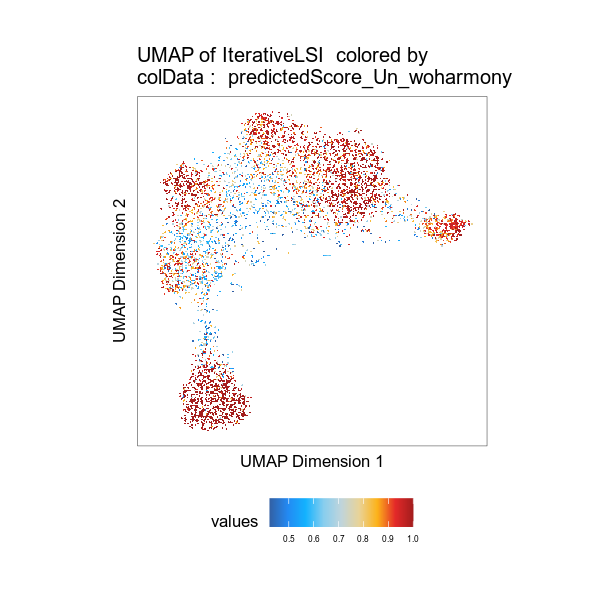

In [13]:
plotEmbedding(
    Merged.proj2, 
    embedding = "UMAP",
    colorBy = "cellColData",
    name = c("predictedGroup_Un_woharmony","predictedScore_Un_woharmony"),
#     pal = pal
)

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-38c674931750-Date-2023-04-14_Time-17-49-32.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 

2 
Warning message:
“package ‘hexbin’ was built under R version 4.2.1”


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-38c674931750-Date-2023-04-14_Time-17-49-32.log



$predictedGroup_Un_woharmony

$predictedScore_Un_woharmony


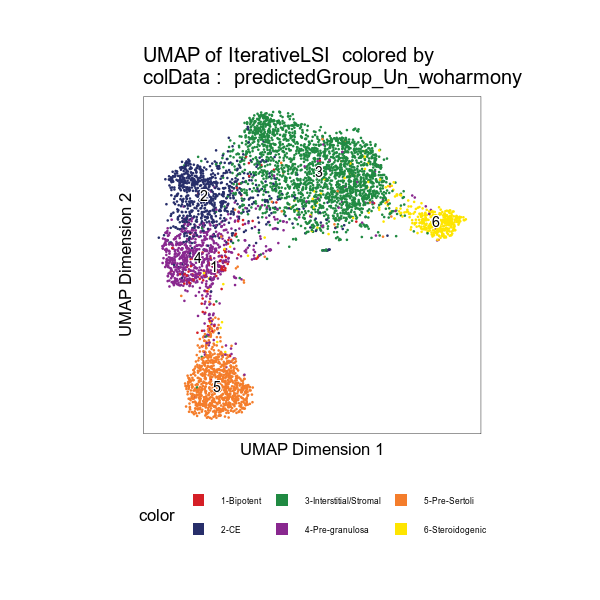

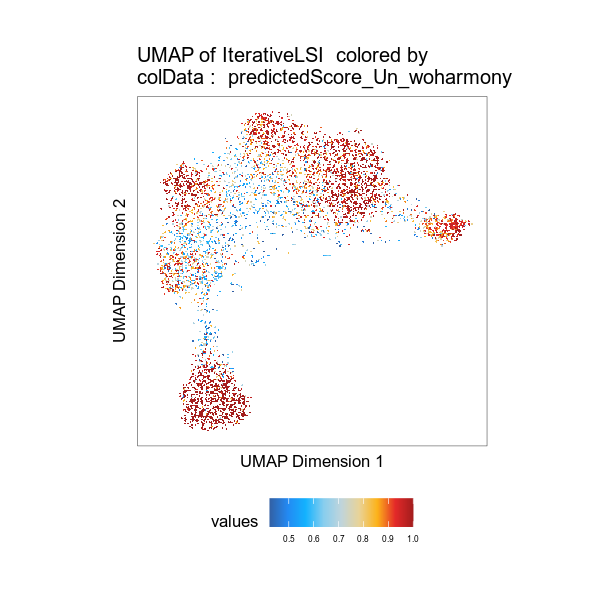

In [7]:
plotEmbedding(
    Merged.proj2, 
    embedding = "UMAP",
    colorBy = "cellColData",
    name = c("predictedGroup_Un_woharmony","predictedScore_Un_woharmony"),
#     pal = pal
)

Interstitial/Stromal        Pre-granulosa                   CE 
           "#D51F26"            "#272E6A"            "#208A42" 
         Pre-Sertoli             Bipotent        Steroidogenic 
           "#89288F"            "#F47D2B"            "#FEE500"

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-38c6220ad899-Date-2023-04-14_Time-17-50-14.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 

2 



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-38c6220ad899-Date-2023-04-14_Time-17-50-14.log



$predictedGroup_Un_woharmony

$Sample


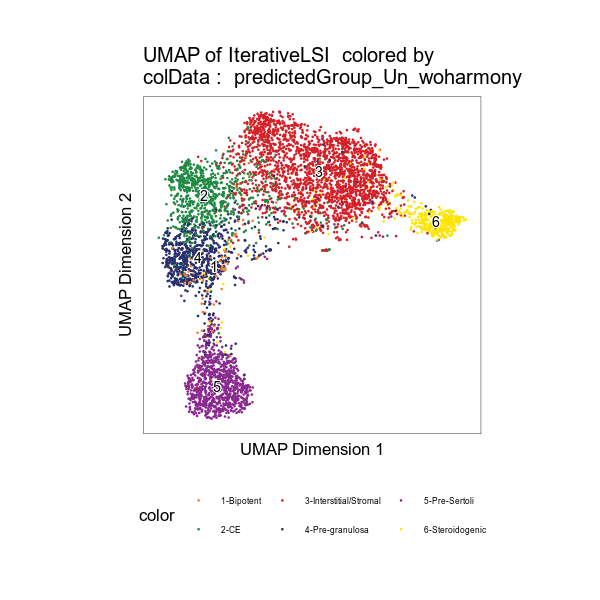

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-38c644a2632e-Date-2023-04-14_Time-17-50-16.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 

2 



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-38c644a2632e-Date-2023-04-14_Time-17-50-16.log



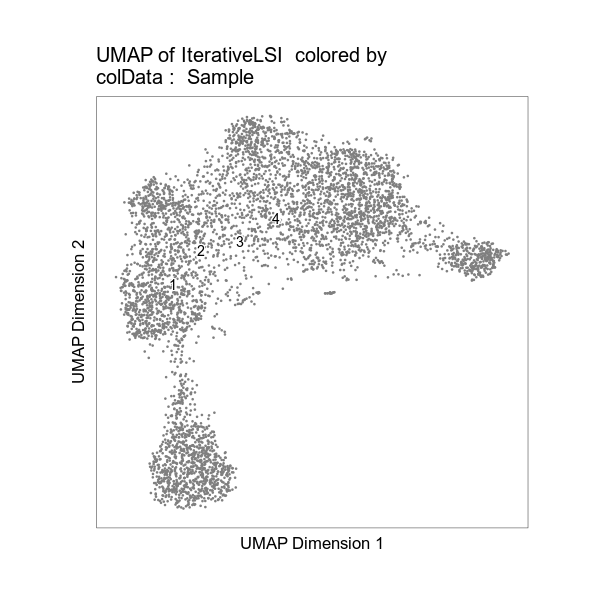

$predictedGroup_Un_woharmony

$cluster


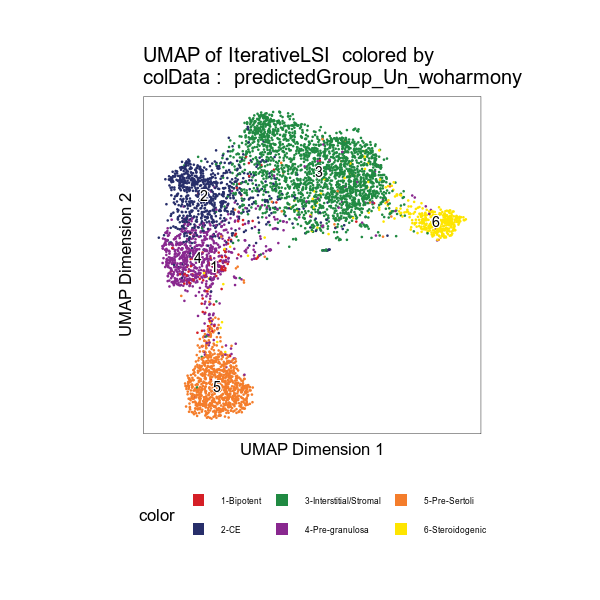

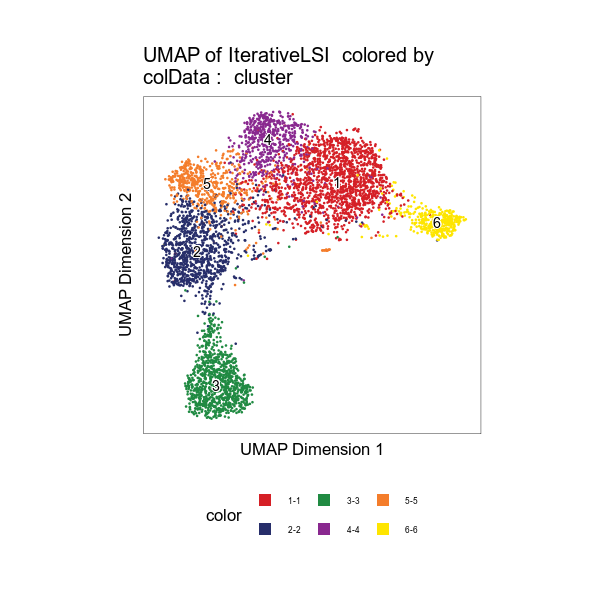

In [10]:
pal <- paletteDiscrete(values = seRNA$celltype)
pal
p1 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAP",
    colorBy = "cellColData",
    name = c("predictedGroup_Un_woharmony","Sample"),
    pal = pal
)
p1
p2 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAP",
    colorBy = "cellColData",
    name = c("predictedGroup_Un_woharmony","cluster"),
#     pal = pal
)
p2

CE        leydig Pre-granulosa Sertoli cells     Stromal 1 
    "#D51F26"     "#272E6A"     "#208A42"     "#89288F"     "#F47D2B" 
    Stromal 2 
    "#FEE500"

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-727d32d4ffcf-Date-2022-03-21_Time-11-04-54.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 

2 



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-727d32d4ffcf-Date-2022-03-21_Time-11-04-54.log



$predictedGroup_Un_woharmony

$Sample


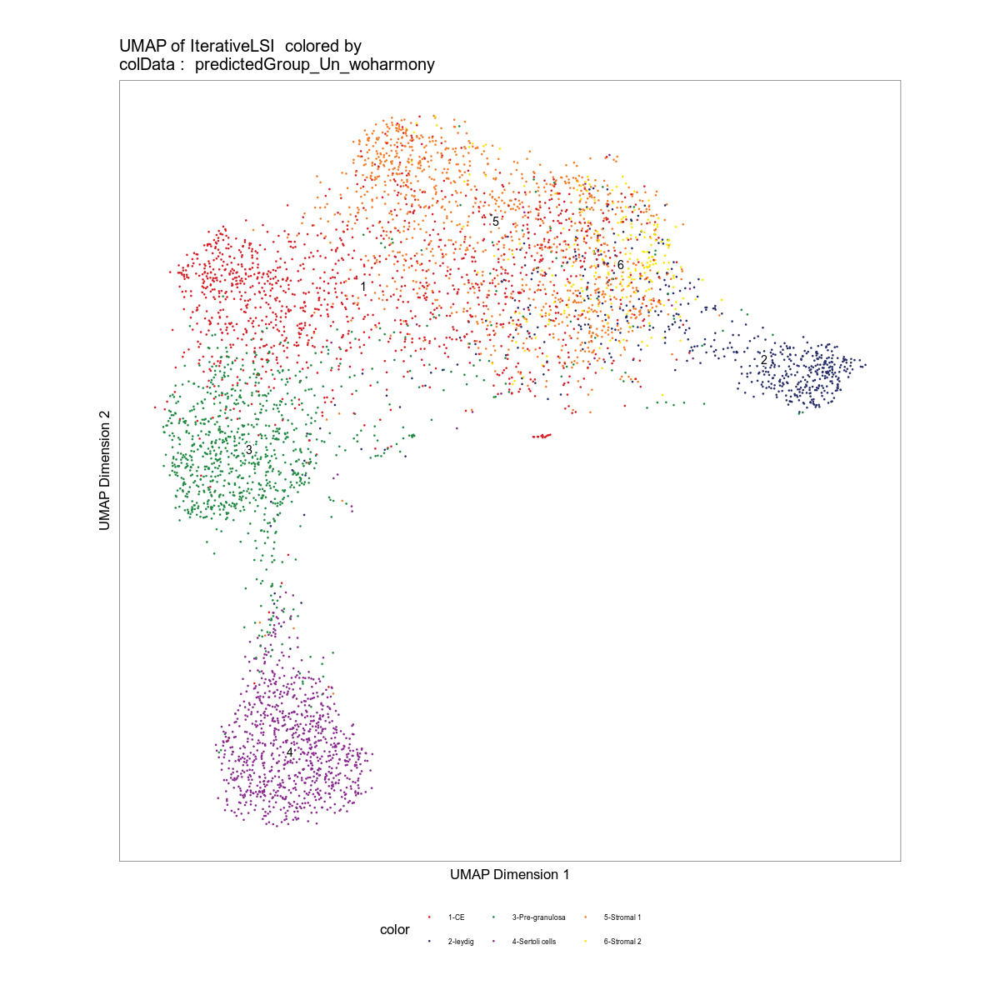

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-727d6be0c2e1-Date-2022-03-21_Time-11-04-56.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 

2 



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-727d6be0c2e1-Date-2022-03-21_Time-11-04-56.log



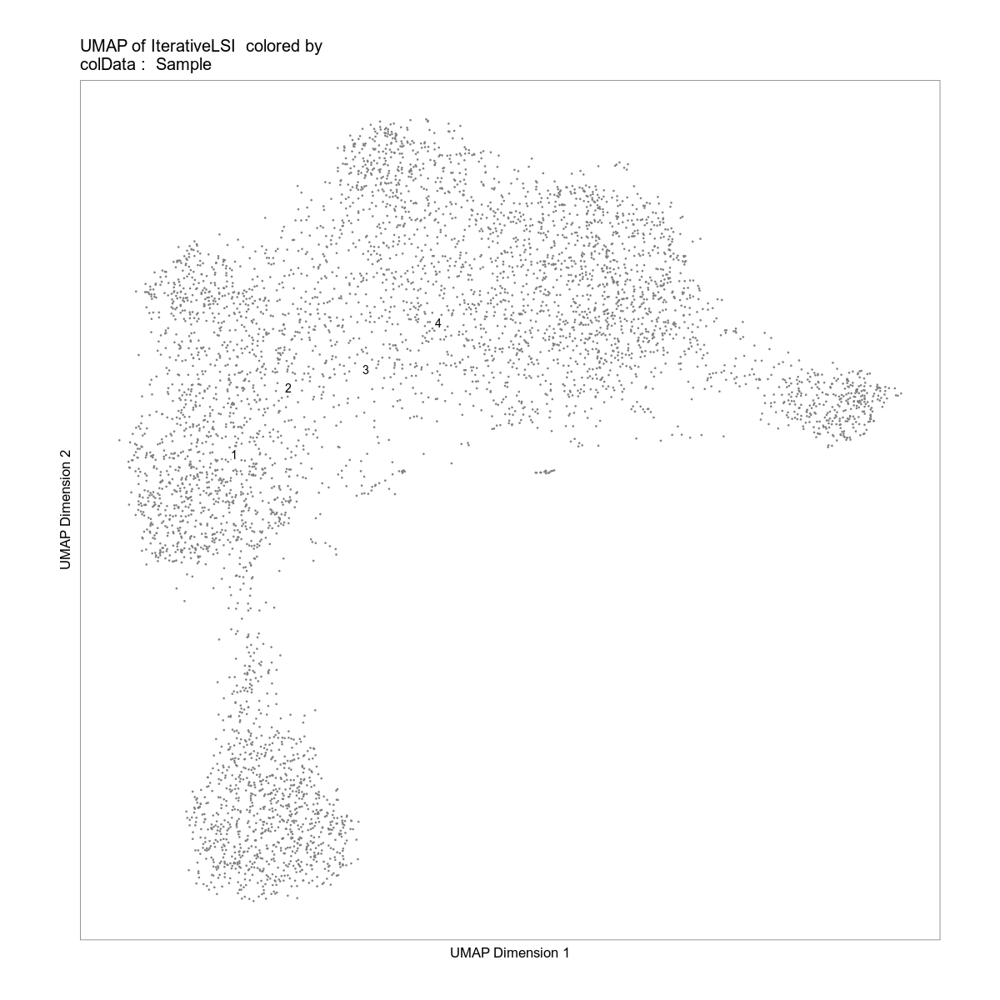

$predictedGroup_Un_woharmony

$cluster


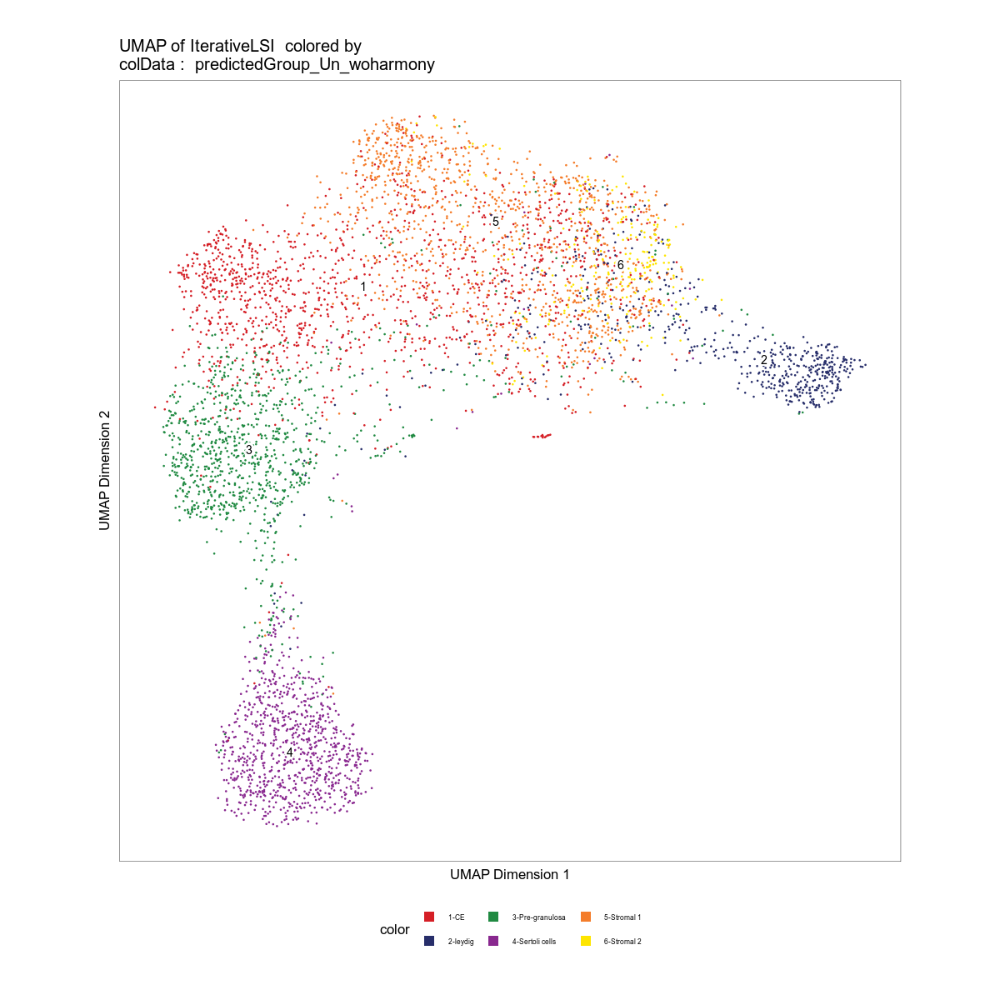

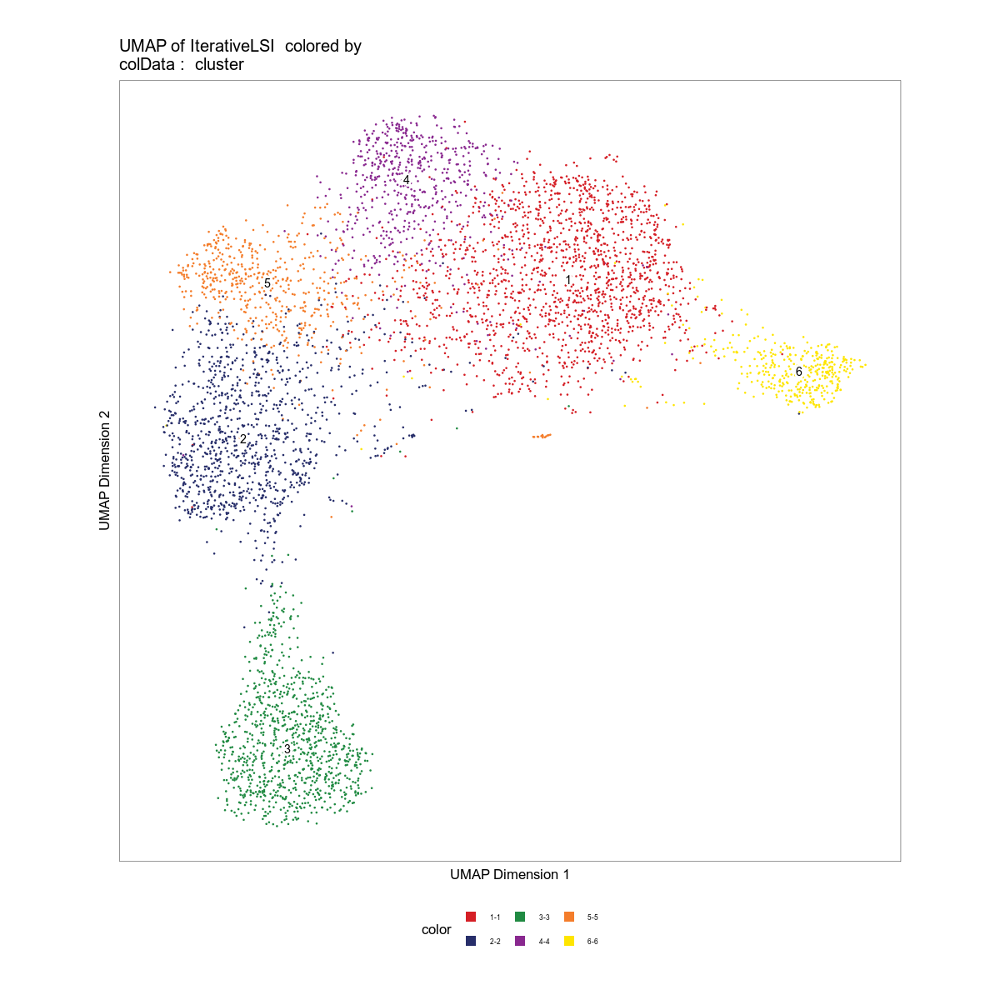

In [53]:
pal <- paletteDiscrete(values = seRNA$celltype)
pal
p1 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAP",
    colorBy = "cellColData",
    name = c("predictedGroup_Un_woharmony","Sample"),
    pal = pal
)
p1
p2 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAP",
    colorBy = "cellColData",
    name = c("predictedGroup_Un_woharmony","cluster"),
#     pal = pal
)
p2

## Constrained integration

In [54]:
Merged.proj2@cellColData$time_cluster <- paste0(Merged.proj2@cellColData$Sample,"_C",Merged.proj2@cellColData$cluster)

In [34]:
seRNA@meta.data$celltype %>% table
Merged.proj2@cellColData$cluster %>% table

.
           CE        leydig Pre-granulosa Sertoli cells     Stromal 1 
          158            12           149            42           131 
    Stromal 2 
           84 

.
   1    2    3    4    5    6 
1587 1048  942  584  553  379 

In [58]:
# Using harmony.Clusters / No need to split time points
# Need to further constrain sertoli cells
groupList <- SimpleList(
#  Leydig = SimpleList(
#         ATAC = Merged.proj2$cellNames[Merged.proj2$cluster %in% c("7","8")]
# ,
#         RNA = colnames(seRNA)[seRNA@meta.data$celltype %in% c("Leydig")]
#     ),
#      Bipotent = SimpleList(
#         ATAC = Merged.proj2$cellNames[Merged.proj2$time_cluster %in% c("TP12_C2")]
# ,
#         RNA = colnames(seRNA)[seRNA@meta.data$cluster6 %in% c("Bipotent")]
#     ),
    S1 = SimpleList(
        ATAC = Merged.proj2$cellNames[Merged.proj2$cluster %in% c("1")]
,
        RNA = colnames(seRNA)[seRNA@meta.data$cluster %in% c("Stromal 1")]
    ),
    S2 = SimpleList(
        ATAC = Merged.proj2$cellNames[Merged.proj2$cluster %in% c("4")]
,
        RNA = colnames(seRNA)[seRNA@meta.data$cluster %in% c("Stromal 2")]
    ),

#        Pregranulosa = SimpleList(
#         ATAC = Merged.proj2$cellNames[(Merged.proj2$time_cluster %in% c("TP15_C2","TP13_C2","TP14_C2"))]
# ,
#         RNA = colnames(seRNA)[seRNA@meta.data$cluster6 %in% c("Pre-granulosa")]
#     ),
    
    Rest = SimpleList(
        ATAC = Merged.proj2$cellNames[!(Merged.proj2$cluster %in% c("1","4"))]
,
        RNA = colnames(seRNA)[!seRNA@meta.data$cluster %in% c("Stromal 1","Stromal 2")]
    )
)


In [59]:
Merged.proj2 <- addGeneIntegrationMatrix(
    ArchRProj = Merged.proj2, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "IterativeLSI",
    seRNA = seRNA,
    addToArrow = TRUE,
    groupList = groupList,
    groupATAC = "cluster",
    groupRNA = "celltype",
    nameCell = "predictedCell_Co",
    nameGroup = "predictedGroup_Co",
    nameScore = "predictedScore_Co",
    force = TRUE
)




ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-cea449ae4f32-Date-2022-03-21_Time-17-45-20.log
If there is an issue, please report to github with logFile!

2022-03-21 17:45:20 : Running Seurat's Integration Stuart* et al 2019, 0.007 mins elapsed.

2022-03-21 17:45:20 : Checking ATAC Input, 0.009 mins elapsed.

2022-03-21 17:45:21 : Checking RNA Input, 0.016 mins elapsed.

2022-03-21 17:45:23 : Found 15938 overlapping gene names from gene scores and rna matrix!, 0.047 mins elapsed.

2022-03-21 17:45:23 : Creating Integration Blocks, 0.047 mins elapsed.

2022-03-21 17:45:23 : Prepping Interation Data, 0.047 mins elapsed.

Filtering 20 dims correlated > 0.75 to log10(depth + 1)

2022-03-21 17:45:24 : Computing Integration in 3 Integration Blocks!, 0 mins elapsed.

2022-03-21 17:45:24 : Block (1 of 3) : Computing Integration, 0 mins elapsed.

2022-03-21 17:45:24 : Block (1 of 3) : Identifying Variable Genes, 0.011 mins elapsed.

2022-03-21 17:45:25 : Block (1 of 3) : Getting Ge

In [11]:

pal <- paletteDiscrete(values = c("Early prog.", "Leydig", "Pre-granulosa", "Sertoli cells", "Stromal prog."),
                       set = "grove", reverse = FALSE)

# p <- plotEmbedding(
#     Merged.proj2, 
#     embedding = "UMAP",
#     colorBy = "cellColData",
#     name = c("predictedGroup_Co"),
#     pal = pal,
#     size = 0.75
# )
# p




ArchR logging to : ArchRLogs/ArchR-plotEmbedding-38c66caded6b-Date-2023-04-14_Time-17-51-10.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 

2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-38c66caded6b-Date-2023-04-14_Time-17-51-10.log



$predictedGroup_Co

$predictedScore_Co


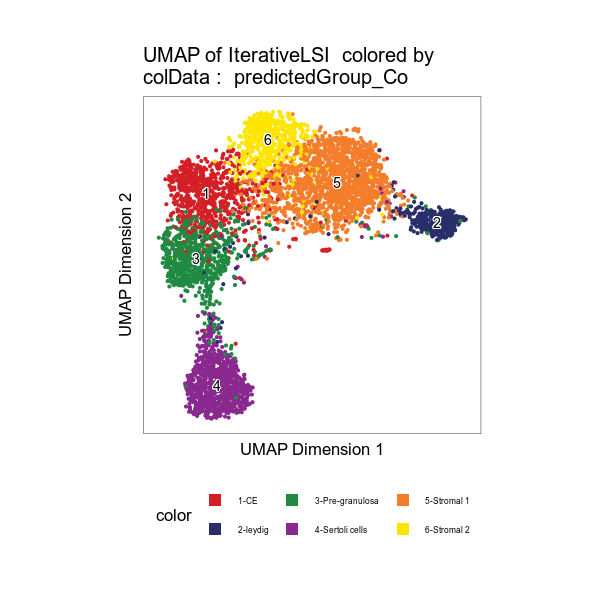

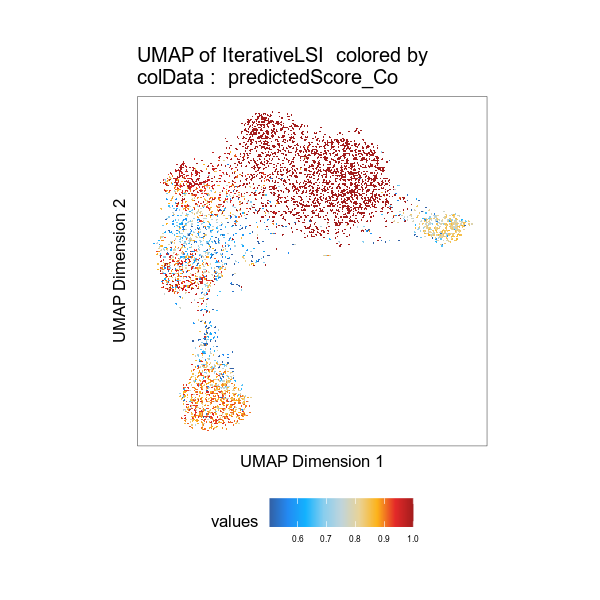

In [12]:
p4 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAP",
    colorBy = "cellColData",
    name = c("predictedGroup_Co","predictedScore_Co" ),
    size = 0.5
    
#     pal = pal
)
p4

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-cea479020382-Date-2022-03-21_Time-18-54-48.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 

2 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-cea479020382-Date-2022-03-21_Time-18-54-48.log



$predictedGroup_Co

$predictedScore_Co


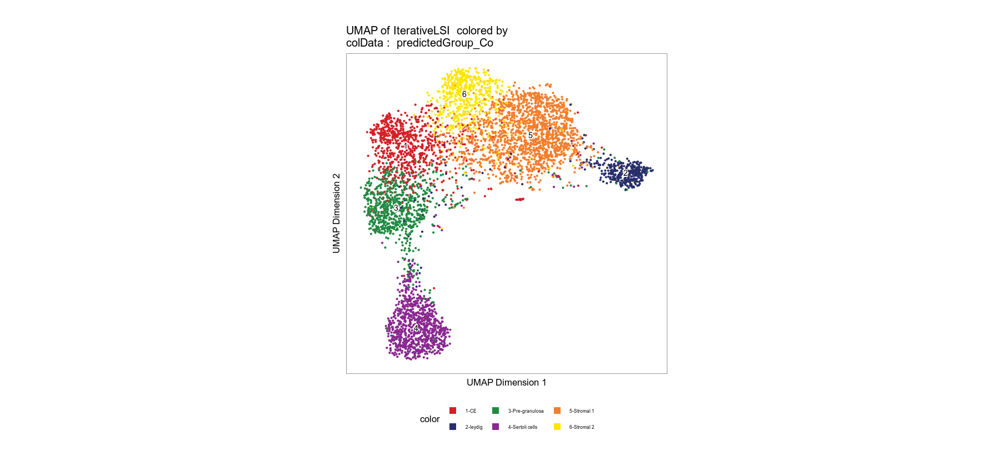

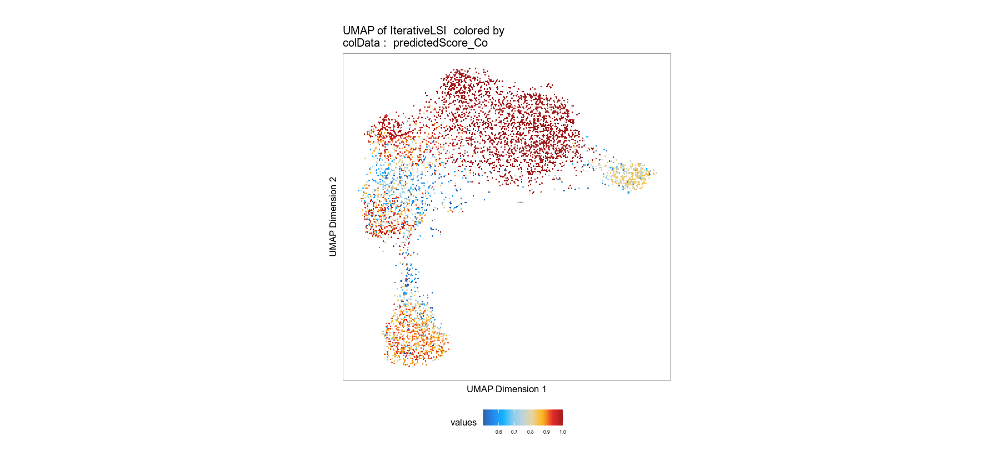

In [60]:
p4 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAP",
    colorBy = "cellColData",
    name = c("predictedGroup_Co","predictedScore_Co" ),
    size = 0.5
    
#     pal = pal
)
p4

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-84bd6d3d337d-Date-2022-04-04_Time-19-35-28.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 



ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-84bd6d3d337d-Date-2022-04-04_Time-19-35-28.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-84bd4ffbd49f-Date-2022-04-04_Time-19-35-29.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-84bd4ffbd49f-Date-2022-04-04_Time-19-35-29.log



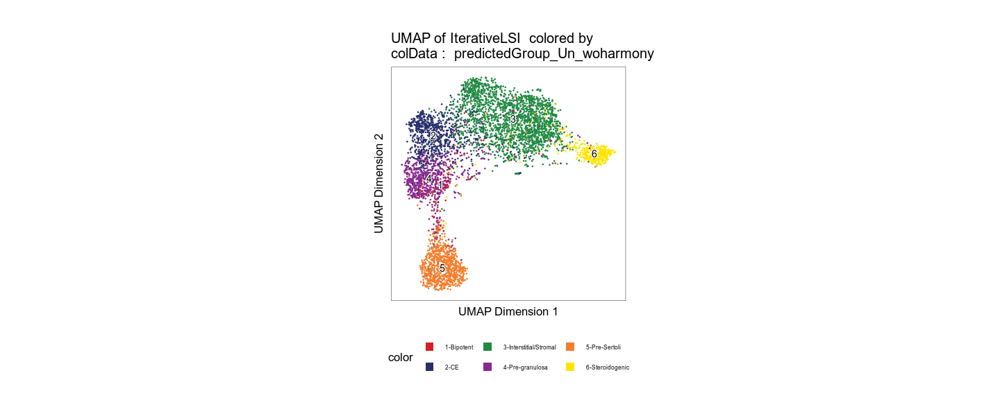

png 
  2

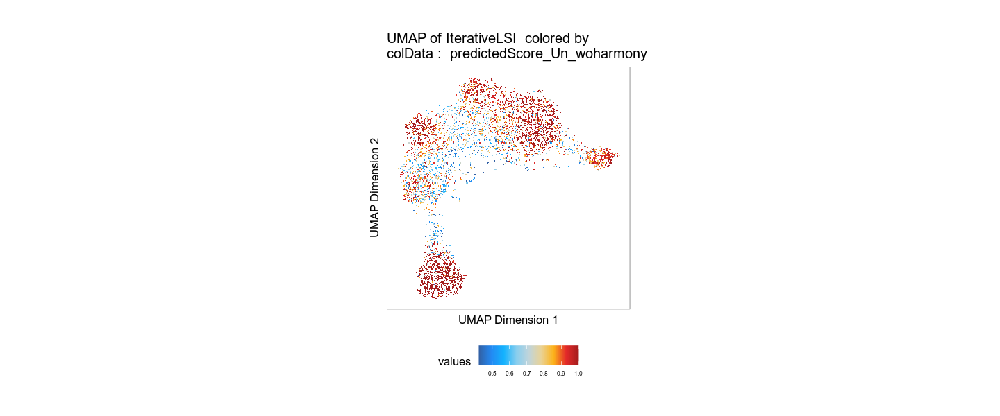

In [55]:
pal <- paletteDiscrete(values = seRNA$celltype)
p3 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAP",
    colorBy = "cellColData",
    name = "predictedGroup_Un_woharmony", 
#     pal = pal
)
p3

p4 <- plotEmbedding(
    Merged.proj2, 
    embedding = "UMAP",
    colorBy = "cellColData",
    name = "predictedScore_Un_woharmony", 
#     pal = pal
)
p4

pdf("./2022Figure/integration.iscience.UMAP.pdf")
p3
p4
dev.off()

In [152]:
# pathToMacs2 <- findMacs2()
# Merged.proj2 <- addGroupCoverages(ArchRProj = Merged.proj2, groupBy = "cluster",maxCells = 10000,
#        force = TRUE)
# Merged.proj2 <- addReproduciblePeakSet(
#     ArchRProj = Merged.proj2, 
#     maxPeaks = 200000,
#     groupBy = "cluster", 
#     pathToMacs2 = pathToMacs2,
#     peaksPerCell = 10000,
#        excludeChr = "chrM",
#     force = TRUE 
# )

# Merged.proj2 <- addPeakMatrix(Merged.proj2)

Searching For MACS2..

Found with $path!

ArchR logging to : ArchRLogs/ArchR-addGroupCoverages-2bf240862eab-Date-2022-01-06_Time-15-07-08.log
If there is an issue, please report to github with logFile!

1 (1 of 6) : CellGroups N = 3

2 (2 of 6) : CellGroups N = 4

3 (3 of 6) : CellGroups N = 3

4 (4 of 6) : CellGroups N = 3

5 (5 of 6) : CellGroups N = 4

6 (6 of 6) : CellGroups N = 3

2022-01-06 15:07:09 : Creating Coverage Files!, 0.017 mins elapsed.

2022-01-06 15:07:09 : Batch Execution w/ safelapply!, 0.017 mins elapsed.

2022-01-06 15:07:09 : Group 1._.TP15 (1 of 20) : Creating Group Coverage File : X1._.TP15.insertions.coverage.h5, 0.017 mins elapsed.

Number of Cells = 720

Coverage File Exists!

Added Coverage Group

Added Metadata Group

Added ArrowCoverage Class

Added Coverage/Info

Added Coverage/Info/CellNames

2022-01-06 15:07:33 : Group 1._.TP14 (2 of 20) : Creating Group Coverage File : X1._.TP14.insertions.coverage.h5, 0.415 mins elapsed.

Number of Cells = 531

Cover

  Group nCells nCellsUsed nReplicates nMin nMax maxPeaks
1     1   1587       1575           3  324  720    2e+05
2     2   1048       1048           4  186  353    2e+05
3     3    942        916           3  277  349    2e+05
4     4    584        580           3   45  354    2e+05
5     5    553        553           4   59  178    2e+05
6     6    379        375           3   59  189    2e+05


2022-01-06 15:21:12 : Batching Peak Calls!, 0.01 mins elapsed.

2022-01-06 15:21:12 : Batch Execution w/ safelapply!, 0 mins elapsed.

2022-01-06 15:21:12 : Group 1 of 20, Calling Peaks with MACS2!, 0 mins elapsed.

Running Macs2 with Params : macs2 callpeak -g 1.87e+09 --name X1._.TP15-1 --treatment /home/leetl/sex_differentiation/gonad_fil_somatic202112/PeakCalls/InsertionBeds/X1._.TP15-1.insertions.bed --outdir /home/leetl/sex_differentiation/gonad_fil_somatic202112/PeakCalls/InsertionBeds --format BED --call-summits --keep-dup all --nomodel --nolambda --shift -75 --extsize 150 -q 0.1

2022-01-06 15:22:21 : Group 2 of 20, Calling Peaks with MACS2!, 1.151 mins elapsed.

Running Macs2 with Params : macs2 callpeak -g 1.87e+09 --name X1._.TP14-2 --treatment /home/leetl/sex_differentiation/gonad_fil_somatic202112/PeakCalls/InsertionBeds/X1._.TP14-2.insertions.bed --outdir /home/leetl/sex_differentiation/gonad_fil_somatic202112/PeakCalls/InsertionBeds --format BED --call-summits --keep-du

[1] "/home/leetl/sex_differentiation/gonad_fil_somatic202112/PeakCalls/X1-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/sex_differentiation/gonad_fil_somatic202112/PeakCalls/X2-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/sex_differentiation/gonad_fil_somatic202112/PeakCalls/X3-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/sex_differentiation/gonad_fil_somatic202112/PeakCalls/X4-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/sex_differentiation/gonad_fil_somatic202112/PeakCalls/X5-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/home/leetl/sex_differentiation/gonad_fil_somatic202112/PeakCalls/X6-reproduciblePeaks.gr.rds"


2022-01-06 15:38:35 : Creating Union Peak Set!, 17.402 mins elapsed.

Converged after 6 iterations!

Plotting Ggplot!

2022-01-06 15:38:39 : Finished Creating Union Peak Set (134954)!, 17.458 mins elapsed.

ArchR logging to : ArchRLogs/ArchR-addPeakMatrix-2bf26a928b92-Date-2022-01-06_Time-15-38-39.log
If there is an issue, please report to github with logFile!

2022-01-06 15:38:39 : Batch Execution w/ safelapply!, 0 mins elapsed.

.createArrowGroup : Arrow Group already exists! Dropping Group from ArrowFile! This will take ~10-30 seconds!

.dropGroupsFromArrow : Initializing Temp ArrowFile

.dropGroupsFromArrow : Adding Metadata to Temp ArrowFile

.dropGroupsFromArrow : Adding SubGroups to Temp ArrowFile

.dropGroupsFromArrow : Move Temp ArrowFile to ArrowFile

2022-01-06 15:38:49 : Adding TP15 to PeakMatrix for Chr (1 of 21)!, 0.006 mins elapsed.

2022-01-06 15:38:52 : Adding TP15 to PeakMatrix for Chr (2 of 21)!, 0.046 mins elapsed.

2022-01-06 15:38:54 : Adding TP15 to PeakMatrix fo

In [148]:
Merged.proj2 <- addCoAccessibility(
    ArchRProj = Merged.proj2,
    reducedDims = "IterativeLSI"
)

cA <- getCoAccessibility(
    ArchRProj = Merged.proj2,
    corCutOff = 0.3,
    resolution = 1,
    returnLoops = TRUE
)

Merged.proj2 <- addPeak2GeneLinks(
    ArchRProj = Merged.proj2,
    reducedDims = "IterativeLSI"
)

p2g <- getPeak2GeneLinks(
    ArchRProj = Merged.proj2,
    corCutOff = 0.3,
    resolution = 1,
    returnLoops = TRUE
)
p2g.df <- getPeak2GeneLinks(
    ArchRProj = Merged.proj2,
    corCutOff = 0.3,
    resolution = 1,
    returnLoops = FALSE
)






ArchR logging to : ArchRLogs/ArchR-addCoAccessibility-cea42ff1c38b-Date-2022-03-22_Time-14-22-41.log
If there is an issue, please report to github with logFile!

Filtering 20 dims correlated > 0.75 to log10(depth + 1)

2022-03-22 14:22:41 : Computing KNN, 0.005 mins elapsed.

2022-03-22 14:22:41 : Identifying Non-Overlapping KNN pairs, 0.007 mins elapsed.

2022-03-22 14:22:45 : Identified 498 Groupings!, 0.059 mins elapsed.

2022-03-22 14:22:47 : Computing Co-Accessibility chr1 (1 of 21), 0.099 mins elapsed.

2022-03-22 14:22:54 : Computing Co-Accessibility chr2 (2 of 21), 0.223 mins elapsed.

2022-03-22 14:23:03 : Computing Co-Accessibility chr3 (3 of 21), 0.366 mins elapsed.

2022-03-22 14:23:09 : Computing Co-Accessibility chr4 (4 of 21), 0.471 mins elapsed.

2022-03-22 14:23:18 : Computing Co-Accessibility chr5 (5 of 21), 0.615 mins elapsed.

2022-03-22 14:23:26 : Computing Co-Accessibility chr6 (6 of 21), 0.746 mins elapsed.

2022-03-22 14:23:32 : Computing Co-Accessibility chr7 (

## Choose the parameter for p2g clustering

In [4]:
# # Version 1
# p2g.mtx <- plotPeak2GeneHeatmap(ArchRProj = Merged.proj2, 
#                                corCutOff = 0.5,
#        FDRCutOff = 0.01,
#        varCutOffAvarCutOffRNATAC = 0.25,
#         = 0.4,
#                           groupBy = "cluster",
# #                           groupBy = "predictedGroup_Un_woharmony",
#                           k = 6,
#                                 returnMat=TRUE)
# # saveRDS(p2g.mtx,file="Somatic_cell.addp2g.rds")
# p2g.heatmap.df <- p2g.mtx[[3]]@listData %>% as.data.frame %>% dplyr::mutate(cluster = p2g.mtx[[1]][[2]])
# version 2
p2g.mtx <- plotPeak2GeneHeatmap(ArchRProj = Merged.proj2,
                          corCutOff = 0.5,
       FDRCutOff = 0.01,
#        varCutOffATAC = 0.25,
#        varCutOffRNA = 0.4,
                          groupBy = "cluster",
#                           groupBy = "predictedGroup_Un_woharmony",
                          k = 6,returnMat=TRUE
                         )
# saveRDS(p2g.mtx,file="Somatic_cell.addp2g.rds")
p2g.heatmap.df <- p2g.mtx[[3]]@listData %>% as.data.frame %>% dplyr::mutate(cluster = p2g.mtx[[1]][[2]])




ArchR logging to : ArchRLogs/ArchR-plotPeak2GeneHeatmap-84bd454c4109-Date-2022-04-04_Time-17-47-43.log
If there is an issue, please report to github with logFile!

2022-04-04 17:48:36 : Determining KNN Groups!, 0.884 mins elapsed.

2022-04-04 17:48:41 : Ordering Peak2Gene Links!, 0.959 mins elapsed.



ArchR logging to : ArchRLogs/ArchR-plotPeak2GeneHeatmap-84bd33902d4f-Date-2022-04-04_Time-19-36-35.log
If there is an issue, please report to github with logFile!

2022-04-04 19:37:26 : Determining KNN Groups!, 0.847 mins elapsed.

2022-04-04 19:37:30 : Ordering Peak2Gene Links!, 0.912 mins elapsed.

2022-04-04 19:37:34 : Constructing ATAC Heatmap!, 0.979 mins elapsed.

Adding Annotations..

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

2022-04-04 19:37:34 : Constructing RNA Heatmap!, 0.989 mins elapsed.

Adding Annotations..

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotPeak2GeneHeatmap-84bd33902d4f-Date-2022-04-04_Time-19-36-35.log



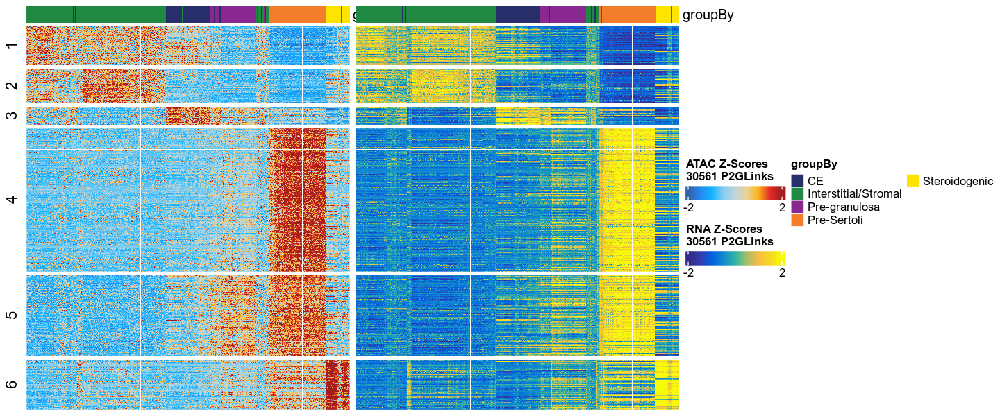

In [56]:
plotPeak2GeneHeatmap(ArchRProj = Merged.proj2,
                          corCutOff = 0.5,
       FDRCutOff = 0.01,
#        varCutOffATAC = 0.25,
#        varCutOffRNA = 0.4,
                          groupBy = "predictedGroup_Un_woharmony",
#                           groupBy = "predictedGroup_Un_woharmony",
                          k = 6
                         )

ArchR logging to : ArchRLogs/ArchR-plotPeak2GeneHeatmap-84bd5c78691e-Date-2022-04-04_Time-17-48-48.log
If there is an issue, please report to github with logFile!

2022-04-04 17:49:32 : Determining KNN Groups!, 0.731 mins elapsed.

2022-04-04 17:49:36 : Ordering Peak2Gene Links!, 0.807 mins elapsed.

2022-04-04 17:49:41 : Constructing ATAC Heatmap!, 0.888 mins elapsed.

Adding Annotations..

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

2022-04-04 17:49:46 : Constructing RNA Heatmap!, 0.976 mins elapsed.

Adding Annotations..

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotPeak2GeneHeatmap-84bd5c78691e-Date-2022-04-04_Time-17-48-48.log



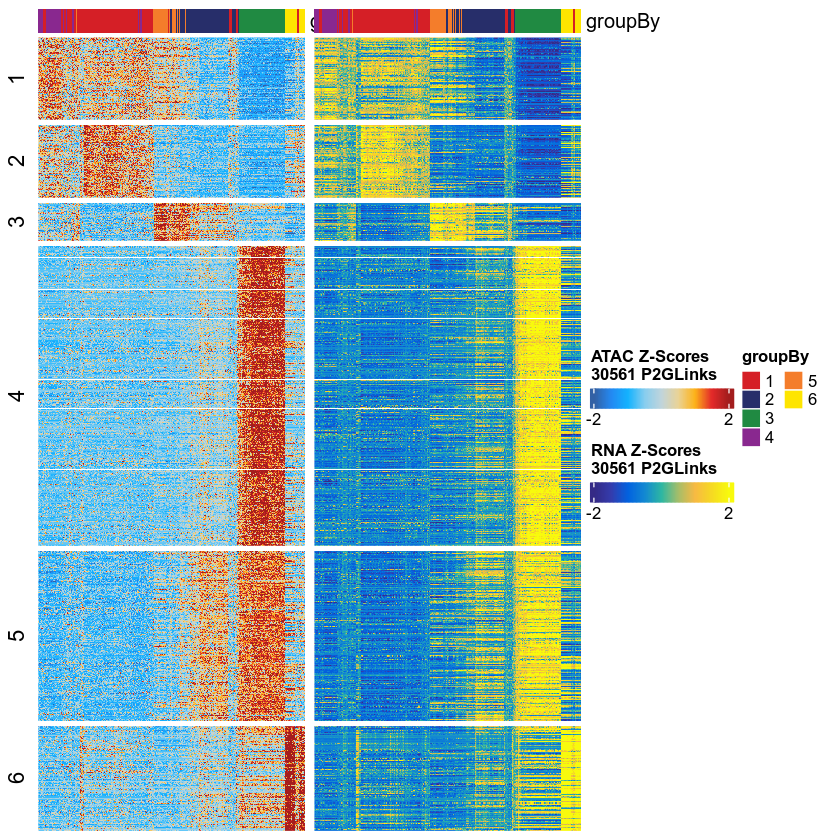

In [5]:
p2g.heatmap <- plotPeak2GeneHeatmap(ArchRProj = Merged.proj2,
                          corCutOff = 0.5,
       FDRCutOff = 0.01,
#        varCutOffATAC = 0.25,
#        varCutOffRNA = 0.4,
                          groupBy = "cluster",
#                           groupBy = "predictedGroup_Un_woharmony",
                          k = 6
                         )
pdf(file="./2022Figure/somaticcell.6cluster.p2g.202203.pdf",width=10,height=6)
p2g.heatmap
dev.off()

## Plot p2g browser track

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-cea47b817fc1-Date-2022-03-23_Time-10-39-30.log
If there is an issue, please report to github with logFile!

2022-03-23 10:39:32 : Validating Region, 0.023 mins elapsed.



GRanges object with 1 range and 2 metadata columns:
      seqnames            ranges strand |     gene_id      symbol
         <Rle>         <IRanges>  <Rle> | <character> <character>
  [1]     chr2 38692656-38714542      - |       26423       Nr5a1
  -------
  seqinfo: 21 sequences from mm10 genome


2022-03-23 10:39:32 : Adding Bulk Tracks (1 of 1), 0.025 mins elapsed.

Getting Region From Arrow Files 1 of 4

Getting Region From Arrow Files 2 of 4

Getting Region From Arrow Files 3 of 4

Getting Region From Arrow Files 4 of 4

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-03-23 10:39:39 : Adding Feature Tracks (1 of 1), 0.139 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-03-23 10:39:39 : Adding Loop Tracks (1 of 1), 0.142 mins elapsed.

2022-03-23 10:39:39 : Adding Gene Tracks (1 of 1), 0.146 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-03-23 10:39:39 : Plotting, 0.149 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotBrowserTrack-cea47b817fc1-Date-2022-03-23_Time-10-39-30.log



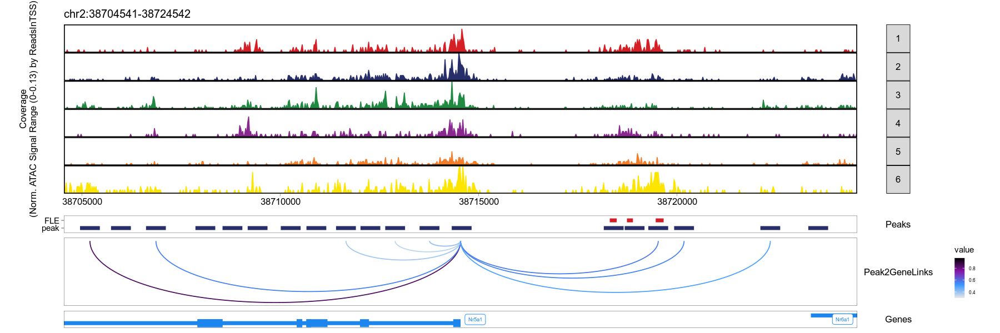

In [302]:
p <- plotBrowserTrack(
    ArchRProj = Merged.proj2, 
    groupBy = "cluster", 
        geneSymbol = "Nr5a1", 
    
features = GRangesList(FLE = GRanges(c("chr2:38719462-38719662","chr2:38718737-38718888","chr2:38718304-38718479")),
#                        TrackB = ("chr2:105120673-105132509"),
    peak =getPeakSet(Merged.proj2)),
    upstream = 10000,
    downstream = 10000,
         tileSize = 25,
    loops = getPeak2GeneLinks(Merged.proj2,corCutOff = 0.3,
       FDRCutOff = 0.05,resolution = 1),
        sizes = c(5, 0.5, 2, 0.5),

  log2Norm = TRUE,

  minCells = 25,
  normMethod = "ReadsInTSS",
  ylim = NULL,
  pal = NULL,
  baseSize = 10,
  scTileSize = 0.5,
  scCellsMax = 100,
  borderWidth =2,
  tickWidth = 0.2,
  facetbaseSize = 10,
    
)
options(repr.plot.width=15
       )
grid::grid.newpage()
grid::grid.draw(p[[1]])

In [69]:
p2g.heatmap.addtss.df  %>% dplyr::filter(gene == "Wnt6") %>% 
    filter(cluster == "5") %>%
    dplyr::select(peak) %>% separate(peak,c("chr","start","end")) %>% GRanges

# %>% GRanges

GRanges object with 9 ranges and 0 metadata columns:
      seqnames            ranges strand
         <Rle>         <IRanges>  <Rle>
  [1]     chr1 74748706-74749206      *
  [2]     chr1 74775742-74776242      *
  [3]     chr1 74782635-74783135      *
  [4]     chr1 74594165-74594665      *
  [5]     chr1 74824786-74825286      *
  [6]     chr1 74774059-74774559      *
  [7]     chr1 74882272-74882772      *
  [8]     chr1 74782094-74782594      *
  [9]     chr1 74770910-74771410      *
  -------
  seqinfo: 1 sequence from an unspecified genome; no seqlengths

In [160]:
p <- plotBrowserTrack(
    ArchRProj = Merged.proj2, 
    groupBy = "cluster", 
        # geneSymbol = "Wnt6", 
     # region = GRanges("chr2:105120673-105132509"),
    region = c(GRanges("chr1:74759883-74780000"),
               GRanges("chr2:105120673-105132509"),
                  GRanges("chr10:22810000-22822128"),
                          GRanges("chr9:57990268-58058666")),
                  
# features = GRangesList(TrackA = GRanges("chr1:74751267-74760079"), chr1:74749883-74761404
#                        TrackB = ("chr2:105120673-105132509"),
#     peak =getPeakSet(Merged.proj2)),
    # upstream = 10000,
    # downstream = 10000,
         tileSize = 25,
    loops = getPeak2GeneLinks(Merged.proj2),
        sizes = c(5, 0.5, 2, 0.5),

  log2Norm = TRUE,

  minCells = 25,
  normMethod = "ReadsInTSS",
  ylim = NULL,
  pal = NULL,
  baseSize = 10,
  scTileSize = 0.5,
  scCellsMax = 100,
  borderWidth =2,
  tickWidth = 0.2,
  facetbaseSize = 10,
)

Warning message in .Seqinfo.mergexy(x, y):
“The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)”
Warning message in .Seqinfo.mergexy(x, y):
“The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)”
Warning message in .Seqinfo.mergexy(x, y):
“The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)”
ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-cea46d173917-Date-2022-03-22_Time-15-49-20.log
If there is an issue, please report to github with logFile!

2022-03-22 15:49:20 : Validating Region, 0.006 mins elapsed.

2022-03-22 15:49:20 : Adding Bulk Tracks (1 of 4), 0.006 mins elapsed.

Getting Region From Arrow Files 1 of 4

Getting Region From Arrow Files 2 of 4

Getting Region From Arrow Files 3 of 4

Getting Region From Arrow Files 4 of 4

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(

In [163]:
pdf("./2022Figure/P2g.browser.pdf",width=20,height=10)
library(cowplot)

library(colorspace)
plot_grid(p[[1]],p[[2]],p[[3]],p[[4]])
# grid::grid.draw(p[[4]])
dev.off()

png 
  2

In [ ]:
### prepare bigwig files for integrated 5 cluster
cluster.barcode <- data_frame(cellname = Merged.proj2$cellNames,cluster = Merged.proj2@cellColData$predictedGroup_Co,
                             sample = Merged.proj2$Sample)

write.table(cluster.barcode %>% filter(sample == "TP12") %>% dplyr::select(cellname,cluster) %>% mutate(cellname = substr(cellname,6,50)),file="./genometrack/TP12.somatic.predictedGroup_Co.cellbarcode.sinto.txt",quote = FALSE, sep = "\t",row.names = FALSE,
                 col.names = FALSE)
write.table(cluster.barcode %>% filter(sample == "TP13") %>% dplyr::select(cellname,cluster) %>% mutate(cellname = substr(cellname,6,50)),file="./genometrack/TP13.somatic.predictedGroup_Co.cellbarcode.sinto.txt",quote = FALSE, sep = "\t",row.names = FALSE,
                 col.names = FALSE)
write.table(cluster.barcode %>% filter(sample == "TP14") %>% dplyr::select(cellname,cluster) %>% mutate(cellname = substr(cellname,6,50)),file="./genometrack/TP14.somatic.predictedGroup_Co.cellbarcode.sinto.txt",quote = FALSE, sep = "\t",row.names = FALSE,
                 col.names = FALSE)
write.table(cluster.barcode %>% filter(sample == "TP15") %>% dplyr::select(cellname,cluster) %>% mutate(cellname = substr(cellname,7,50)),file="./genometrack/TP15.somatic.predictedGroup_Co.cellbarcode.sinto.txt",quote = FALSE, sep = "\t",row.names = FALSE,
                 col.names = FALSE)

In [ ]:
C8.p2g <- p2g.heatmap.df %>% filter(cluster == "8")%>% arrange(desc(VarQRNA))
C8.p2g.gene <- C8.p2g$gene
C8.p2g.gene

In [ ]:
p2g.heatmap.df %>% filter(cluster == "1")%>% arrange(desc(VarQRNA))

In [ ]:
p2g.heatmap.df %>% filter(cluster == "1")  %>% arrange(desc(VarQRNA)) %>% dplyr::select(gene) %>% as.table()
# p2g.heatmap.df %>% filter(cluster == "8")  %>% arrange(desc(freq(gene))) 
# p2g.heatmap.df %>% filter(gene == "Lepr")

In [ ]:
p2g.heatmap.df %>% filter(gene == "Defb19")

## GO analysis

In [9]:

C1.name <- p2g.heatmap.df %>% filter(cluster == "1") %>% dplyr::select(gene) %>% unique()
C2.name <- p2g.heatmap.df %>% filter(cluster == "2") %>% dplyr::select(gene) %>% unique()
C3.name <- p2g.heatmap.df %>% filter(cluster == "3") %>% dplyr::select(gene) %>% unique()
C4.name <- p2g.heatmap.df %>% filter(cluster == "4") %>% dplyr::select(gene) %>% unique()
C5.name <- p2g.heatmap.df %>% filter(cluster == "5") %>% dplyr::select(gene) %>% unique()
C6.name <- p2g.heatmap.df %>% filter(cluster == "6") %>% dplyr::select(gene) %>% unique()
# C7.name <- p2g.heatmap.df %>% filter(cluster == "7") %>% dplyr::select(gene) %>% unique()
# C8.name <- p2g.heatmap.df %>% filter(cluster == "8") %>% dplyr::select(gene) %>% unique()

C1.name <- bitr(C1.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")
C2.name <- bitr(C2.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")
C3.name <- bitr(C3.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")
C4.name <- bitr(C4.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")
C5.name <- bitr(C5.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")
C6.name <- bitr(C6.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")
# C7.name <- bitr(C7.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")
# C8.name <- bitr(C8.name$gene, toType="ENTREZID", fromType="SYMBOL", OrgDb="org.Mm.eg.db")

Loading required package: org.Mm.eg.db

Loading required package: AnnotationDbi


Attaching package: ‘AnnotationDbi’


The following object is masked from ‘package:clusterProfiler’:

    select


The following object is masked from ‘package:dplyr’:

    select




'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(C1.name$gene, toType = "ENTREZID", fromType = "SYMBOL", :
“1.52% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(C2.name$gene, toType = "ENTREZID", fromType = "SYMBOL", :
“1.44% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(C3.name$gene, toType = "ENTREZID", fromType = "SYMBOL", :
“1.16% of input gene IDs are fail to map...”
'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(C4.name$gene, toType = "ENTREZID", fromType = "SYMBOL", :
“1.12% of input gene IDs are fail to map

In [10]:
# GO analysis of genes in 6 clusters
go_enrich1 <- enrichGO(gene = C1.name$SYMBOL,
#                       universe = names(gene_list),
                      OrgDb = 'org.Mm.eg.db', 
                      keyType = 'SYMBOL',
#                       readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.10)
go_enrich2 <- enrichGO(gene = C2.name$SYMBOL,
#                       universe = names(gene_list),
                      OrgDb = 'org.Mm.eg.db', 
                      keyType = 'SYMBOL',
#                       readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.10)
go_enrich3 <- enrichGO(gene = C3.name$SYMBOL,
#                       universe = names(gene_list),
                      OrgDb = 'org.Mm.eg.db', 
                      keyType = 'SYMBOL',
#                       readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.10)
go_enrich4 <- enrichGO(gene = C4.name$SYMBOL,
#                       universe = names(gene_list),
                      OrgDb = 'org.Mm.eg.db', 
                      keyType = 'SYMBOL',
#                       readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.10)
go_enrich5 <- enrichGO(gene = C5.name$SYMBOL,
#                       universe = names(gene_list),
                      OrgDb = 'org.Mm.eg.db', 
                      keyType = 'SYMBOL',
#                       readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.05)
go_enrich6 <- enrichGO(gene = C6.name$SYMBOL,
#                       universe = names(gene_list),
                      OrgDb = 'org.Mm.eg.db', 
                      keyType = 'SYMBOL',
#                       readable = T,
                      ont = "BP",
                      pvalueCutoff = 0.05, 
                      qvalueCutoff = 0.1)


In [11]:
library("viridis") 
options(repr.plot.width=10,repr.plot.height=5)
g1 <- dotplot(go_enrich1, showCategory = 15, title = "Cluster 1")+ scale_color_viridis(option = "cividis",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="plain"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="plain"))+scale_y_discrete(position = "right") 
g2 <- dotplot(go_enrich2, showCategory = 15, title = "Cluster 2")+ scale_color_viridis(option = "cividis",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="plain"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="plain"))+scale_y_discrete(position = "right")
g3 <- dotplot(go_enrich3, showCategory = 15, title = "Cluster 3")+ scale_color_viridis(option = "cividis",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="plain"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="plain"))+scale_y_discrete(position = "right")
g4 <- dotplot(go_enrich4, showCategory = 15, title = "Cluster 4")+ scale_color_viridis(option = "cividis",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="plain"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="plain"))+scale_y_discrete(position = "right")
g5 <- dotplot(go_enrich5, showCategory = 15, title = "Cluster 5")+ scale_color_viridis(option = "cividis",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="plain"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="plain"))+scale_y_discrete(position = "right")
g6 <- dotplot(go_enrich6, showCategory = 15, title = "Cluster 6")+ scale_color_viridis(option = "cividis",direction = -1) + scale_size(range=c(1, 5)) +
        theme(axis.text=element_text(size=10,face="plain"),axis.text.x = element_text(angle = 90, hjust = 1),
        axis.title=element_text(size=10,face="plain"))+scale_y_discrete(position = "right")


Loading required package: viridisLite

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'size' is already present. Adding another scale for 'size', which
will replace the existing scale.

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'size' is already present. Adding another scale for 'size', which
will replace the existing scale.

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'size' is already present. Adding another scale for 'size', which
will replace the existing scale.

Scale for 'y' is already present. Adding another scale for 'y', which will
replac

In [12]:
options(repr.plot.width=15,repr.plot.height=10
       )
library(patchwork)
pdf(file="./2022Figure/somatic.p2g.6cluster.GO.iscience.pdf",width=14,height=10)
(g1 / g2 / g3) | (g4 / g5/ g6) 
# | (g7 )
dev.off()

png 
  2

In [313]:
## Prepare arc files
# metadata(p2g.df)[[2]] %>% as.data.frame() 
# %>% dplyr::select(name,idx)

In [10]:
#Merged.proj2 <- addPeak2GeneLinks(
#    ArchRProj = Merged.proj2,
#    reducedDims = "IterativeLSI"
#)

p2g.df  <- getPeak2GeneLinks(
    ArchRProj = Merged.proj2,
    corCutOff = 0.5,
    resolution = 1,
    returnLoops = FALSE
)
tss.peaks <- metadata(p2g.df)[[2]] %>% as.data.frame() %>% mutate(end = end +1)%>% 
mutate(gene = name) %>%
dplyr::select(gene,seqnames:end)
p2g.heatmap.addtss.df <- p2g.heatmap.df %>% inner_join(tss.peaks,by = "gene") 


In [36]:
## perpare arcs for each cluster
## add tss region df

for (i in p2g.heatmap.addtss.df$cluster) {
p2g.heatmap.addtss.df %>% separate(peak,c("chr1","start1"),sep = ":") %>% 
separate(start1,c("start1","end1"),sep = "-") %>%
filter(cluster == i) %>% dplyr::select(chr1:end1,seqnames:end,Correlation) %>% 
    write_tsv(paste0("./2022Figure/Somaticcell.p2g.heatmap.cluster",i,".arc"),col_names=FALSE)
    }

as.data.frame(p2g[[1]]) %>% mutate(start1=start) %>% mutate(end1=start+1)%>% 
mutate(seqnames1=seqnames) %>% mutate(seqnames2=seqnames) %>% mutate(coaccess = value) %>%
mutate(start2=end) %>% mutate(end2=end+1) %>% 
dplyr::select(seqnames1,start1,end1,seqnames2,start2,end2,coaccess) %>% 
write_tsv("./2022Figure//Somaticcell.p2g.arc",col_names=FALSE)

In [38]:
tss.peaks <- metadata(p2g.df)[[2]] %>% as.data.frame() %>% mutate(end = end +1)%>% 
mutate(gene = name) %>%
dplyr::select(gene,seqnames:end)
p2g.heatmap.addtss.df <- p2g.heatmap.df %>% inner_join(tss.peaks,by = "gene") 


library("writexl")
p2g.heatmap.addtss.df %>% write_xlsx("./2022Figure/somatic.p2g.heatmap.6cluster.list.xlsx")
p2g.heatmap.addtss.df %>% write.csv("./2022Figure/somatic.p2g.heatmap.6cluster.list.csv")


## Positive regulator

In [306]:
# pathToMacs2 <- findMacs2()
# Merged.proj2 <- addGroupCoverages(ArchRProj = Merged.proj2, groupBy = "cluster",maxCells = 10000,
#        force = TRUE)
Merged.proj2 <- addReproduciblePeakSet(
    ArchRProj = Merged.proj2, 
    maxPeaks = 200000,
    groupBy = "cluster", 
    pathToMacs2 = "/lustre/apps/bin/macs2",
    peaksPerCell = 10000,
       excludeChr = "chrM",
    force = TRUE 
)

Merged.proj2 <- addPeakMatrix(Merged.proj2)

ArchR logging to : ArchRLogs/ArchR-addGroupCoverages-cea44dbb691e-Date-2022-03-23_Time-10-50-17.log
If there is an issue, please report to github with logFile!

1 (1 of 6) : CellGroups N = 3

2 (2 of 6) : CellGroups N = 4

3 (3 of 6) : CellGroups N = 3

4 (4 of 6) : CellGroups N = 3

5 (5 of 6) : CellGroups N = 4

6 (6 of 6) : CellGroups N = 3

2022-03-23 10:50:25 : Creating Coverage Files!, 0.136 mins elapsed.

2022-03-23 10:50:25 : Batch Execution w/ safelapply!, 0.136 mins elapsed.

2022-03-23 10:50:25 : Group 1._.TP15 (1 of 20) : Creating Group Coverage File : X1._.TP15.insertions.coverage.h5, 0.136 mins elapsed.

Number of Cells = 720

Coverage File Exists!

Added Coverage Group

Added Metadata Group

Added ArrowCoverage Class

Added Coverage/Info

Added Coverage/Info/CellNames

2022-03-23 10:51:06 : Group 1._.TP14 (2 of 20) : Creating Group Coverage File : X1._.TP14.insertions.coverage.h5, 0.811 mins elapsed.

Number of Cells = 531

Coverage File Exists!

Added Coverage Group

Ad

ERROR: Error in system2(path, "callpeak -h", stdout = TRUE, stderr = TRUE): cannot popen ''/lustre/apps/bin/macs2' callpeak -h 2>&1', probable reason 'Cannot allocate memory'


In [ ]:
Merged.proj2 <- addDeviationsMatrix(
  ArchRProj = Merged.proj2, 
  peakAnnotation = "Motif",
  force = TRUE,
    add = TRUE
)

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2d1432fe27b1-Date-2022-08-07_Time-20-26-08.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2d1432fe27b1-Date-2022-08-07_Time-20-26-08.log



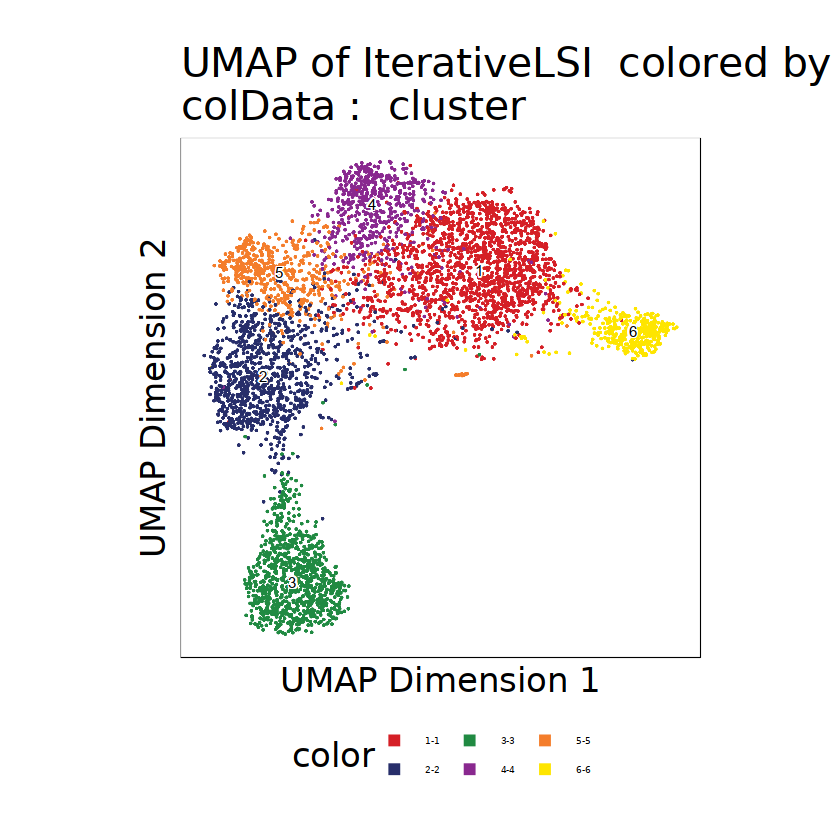

In [81]:
plotEmbedding(ArchRProj = Merged.proj2,embedding = "UMAP", colorBy ="cellColData", 
              name = c("cluster"),
              keepAxis = FALSE,
              plotAs = "points",
                 quantCut = c(0, 0.95),
              size=0.75,
       baseSize = 20)

In [14]:
seGroupMotif <- getGroupSE(ArchRProj = Merged.proj2, useMatrix = "MotifMatrix", groupBy = "Sample")

seZ <- seGroupMotif[rowData(seGroupMotif)$seqnames=="z",]

rowData(seZ)$maxDelta <- lapply(seq_len(ncol(seZ)), function(x){
  rowMaxs(assay(seZ) - assay(seZ)[,x])
}) %>% Reduce("cbind", .) %>% rowMaxs

corGSM_MM <- correlateMatrices(
    ArchRProj = Merged.proj2,
    useMatrix1 = "GeneScoreMatrix",
    useMatrix2 = "MotifMatrix",
#     reducedDims = "Harmony"
)

corGIM_MM <- correlateMatrices(
    ArchRProj = Merged.proj2,
    useMatrix1 = "GeneIntegrationMatrix",
    useMatrix2 = "MotifMatrix",
#     reducedDims = "Harmony"
)

corGSM_MM$maxDelta <- rowData(seZ)[match(corGSM_MM$MotifMatrix_name, rowData(seZ)$name), "maxDelta"]
corGIM_MM$maxDelta <- rowData(seZ)[match(corGIM_MM$MotifMatrix_name, rowData(seZ)$name), "maxDelta"]

ArchR logging to : ArchRLogs/ArchR-getGroupSE-72471f1037de-Date-2023-04-21_Time-22-50-36.log
If there is an issue, please report to github with logFile!

Getting Group Matrix

2023-04-21 22:50:37 : Constructing Group Matrix 1 of 2, 0.001 mins elapsed.

2023-04-21 22:50:39 : Finished Group Matrix 1 of 2, 0.038 mins elapsed.

2023-04-21 22:50:39 : Constructing Group Matrix 2 of 2, 0.039 mins elapsed.

2023-04-21 22:50:41 : Finished Group Matrix 2 of 2, 0.076 mins elapsed.

2023-04-21 22:50:41 : Successfully Created Group Matrix, 0.076 mins elapsed.

Normalizing by number of Cells

ArchR logging successful to : ArchRLogs/ArchR-getGroupSE-72471f1037de-Date-2023-04-21_Time-22-50-36.log

ArchR logging to : ArchRLogs/ArchR-correlateMatrices-72474be96981-Date-2023-04-21_Time-22-50-43.log
If there is an issue, please report to github with logFile!

When accessing features from a matrix of class Sparse.Assays.Matrix it requires 1 seqname!
Continuing with first seqname 'z'!
If confused, try getFe

In [31]:

seRNA.all.markers <- FindAllMarkers(object = seRNA, min.pct = 0.05,only.pos = TRUE)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4



In [10]:
Idents(seRNA) <- "time"

seRNA.time.markers <- FindAllMarkers(object = seRNA, min.pct = 0.05,only.pos = TRUE)

Calculating cluster E11

Calculating cluster E12

Calculating cluster E13



In [17]:
# old
corGSM_MM <- corGSM_MM[order(abs(corGSM_MM$cor), decreasing = TRUE), ]
corGSM_MM <- corGSM_MM[which(!duplicated(gsub("\\-.*","",corGSM_MM[,"MotifMatrix_name"]))), ]
corGSM_MM$TFRegulator <- "NO"
corGSM_MM$TFRegulator[which(corGSM_MM$cor > 0.5 & corGSM_MM$padj < 0.1)] <- "YES"
sort(corGSM_MM[corGSM_MM$TFRegulator=="YES",1])



[1] "Arx"    "Atf6b"  "Crem"   "Ctcfl"  "Dlx3"   "Dmrt1"  "Dmrta1" "Esr1"  
 [9] "Esrrb"  "Ets1"   "Evx1"   "Fosl2"  "Foxl1"  "Foxl1"  "Foxl1"  "Foxl1" 
[17] "Foxl1"  "Foxl1"  "Foxl1"  "Foxl1"  "Foxl1"  "Foxl1"  "Foxl1"  "Gata1" 
[25] "Gata4"  "Gli1"   "Gli2"   "Gm5294" "Gm5294" "Hes5"   "Hic2"   "Hlx"   
[33] "Hoxa1"  "Hoxa10" "Hoxa2"  "Hoxa3"  "Hoxa7"  "Hoxa9"  "Hoxb1"  "Hoxb2" 
[41] "Hoxb7"  "Hoxc10" "Hoxc11" "Hoxc13" "Hoxc4"  "Hoxc8"  "Hoxc9"  "Hoxd11"
[49] "Hoxd13" "Hoxd3"  "Hoxd4"  "Hoxd8"  "Hoxd9"  "Irf1"   "Jun"    "Junb"  
[57] "Jund"   "Lhx1"   "Lhx2"   "Lhx9"   "Mesp1"  "Mesp2"  "Msx2"   "Mypop" 
[65] "Nfatc4" "Nfe2"   "Nfya"   "Nr1d1"  "Nr1i2"  "Nr5a1"  "Nr6a1"  "Ppara" 
[73] "Pparg"  "Rfx3"   "Rorc"   "Runx1"  "Sebox"  "Sox10"  "Sox13"  "Sox15" 
[81] "Sox18"  "Sox8"   "Sp1"    "Srf"    "Stat3"  "Tbx1"   "Tbx22"  "Tcf21" 
[89] "Tef"    "Thra"   "Thrb"   "Uncx"   "Vdr"    "Yy1"

In [18]:
corGIM_MM <- corGIM_MM[order(abs(corGIM_MM$cor), decreasing = TRUE), ]
corGIM_MM <- corGIM_MM[which(!duplicated(gsub("\\-.*","",corGIM_MM[,"MotifMatrix_name"]))), ]
corGIM_MM$TFRegulator <- "NO"
#Final version (0.3,0.05,0.7)
corGIM_MM$TFRegulator[which(corGIM_MM$cor > 0.5 & corGIM_MM$padj < 0.05 & corGIM_MM$maxDelta > quantile(corGIM_MM$maxDelta, 0.6))] <- "YES"
# Negative correlation
# corGIM_MM$TFRegulator[which(corGIM_MM$cor < -1 & corGIM_MM$padj < 0.1 & corGIM_MM$maxDelta > quantile(corGIM_MM$maxDelta, 0.5))] <- "YES"


sort(corGIM_MM[corGIM_MM$TFRegulator=="YES",1])
postiveTF <- corGIM_MM$GeneIntegrationMatrix_name[corGIM_MM$TFRegulator=="YES"]
variableTF <- corGIM_MM$GeneIntegrationMatrix_name[corGIM_MM$variableTF=="only.delta"]

[1] "Arx"    "Atf6b"  "Bcl11a" "Emx2"   "Ets1"   "Etv2"   "Figla"  "Fli1"  
 [9] "Gata4"  "Hic2"   "Hoxa10" "Hoxa3"  "Hoxa7"  "Hoxa9"  "Hoxb2"  "Hoxb3" 
[17] "Hoxb4"  "Hoxb5"  "Hoxc10" "Hoxc6"  "Hoxc8"  "Hoxc9"  "Hoxd10" "Hoxd11"
[25] "Hoxd4"  "Hoxd8"  "Klf14"  "Lef1"   "Lhx9"   "Lmx1a"  "Mga"    "Msc"   
[33] "Nr4a1"  "Nr5a1"  "Pou4f1" "Pou6f1" "Prrx2"  "Rara"   "Rora"   "Tcf21" 
[41] "Tead4"  "Zfp143"

In [185]:
corGIM_MM$TFRegulator[which(corGIM_MM$maxDelta > quantile(corGIM_MM$maxDelta, 0.5))] %>% table 

.
 NO YES 
296  59 

In [197]:
postiveTF2 <- intersect(postiveTF,top10$gene)

postiveTF.GS <- intersect(sort(corGSM_MM[corGSM_MM$TFRegulator=="YES",1]),top10$gene)


In [232]:
corGIM_MM <- corGIM_MM[order(abs(corGIM_MM$cor), decreasing = TRUE), ]
corGIM_MM <- corGIM_MM[which(!duplicated(gsub("\\-.*","",corGIM_MM[,"MotifMatrix_name"]))), ]
corGIM_MM$TFRegulator <- "NO"
#Final version (0.3,0.05,0.7)
corGIM_MM$TFRegulator[which(corGIM_MM$cor > 0.6 & corGIM_MM$padj < 0.05 & corGIM_MM$maxDelta > quantile(corGIM_MM$maxDelta, 0.6))] <- "YES"
# Negative correlation
# corGIM_MM$TFRegulator[which(corGIM_MM$cor < -1 & corGIM_MM$padj < 0.1 & corGIM_MM$maxDelta > quantile(corGIM_MM$maxDelta, 0.5))] <- "YES"


sort(corGIM_MM[corGIM_MM$TFRegulator=="YES",1])
postiveTF <- corGIM_MM$GeneIntegrationMatrix_name[corGIM_MM$TFRegulator=="YES"]
variableTF <- corGIM_MM$GeneIntegrationMatrix_name[corGIM_MM$variableTF=="only.delta"]

[1] "Arx"    "Dmrt1"  "Emx2"   "Ets1"   "Etv2"   "Gata4"  "Hic2"   "Hoxa10"
 [9] "Hoxa3"  "Hoxa7"  "Hoxb2"  "Hoxb4"  "Hoxb7"  "Hoxc10" "Hoxc5"  "Hoxc6" 
[17] "Hoxc8"  "Hoxc9"  "Hoxd10" "Hoxd4"  "Hoxd8"  "Hoxd9"  "Lef1"   "Lhx9"  
[25] "Lmx1a"  "Mga"    "Msc"    "Nr1i3"  "Nr4a1"  "Nr5a1"  "Phf21a" "Prrx2" 
[33] "Rara"   "Rora"   "Sox8"   "Sox9"   "Tcf21"

In [275]:
intersect(sort(corGIM_MM[corGIM_MM$TFRegulator=="YES",1]),sort(corGSM_MM[corGSM_MM$TFRegulator=="YES",1]))

[1] "Arx"    "Atf6b"  "Dmrt1"  "Ets1"   "Gata4"  "Hic2"   "Hoxa10" "Hoxa3" 
 [9] "Hoxa7"  "Hoxa9"  "Hoxb2"  "Hoxb7"  "Hoxc10" "Hoxc4"  "Hoxc8"  "Hoxc9" 
[17] "Hoxd11" "Hoxd4"  "Hoxd8"  "Hoxd9"  "Lhx9"   "Nfe2"   "Nr1d1"  "Nr5a1" 
[25] "Sox10"  "Sox15"  "Sox8"   "Tcf21"  "Thra"

Warning message:
“Removed 114 rows containing missing values (`geom_point()`).”


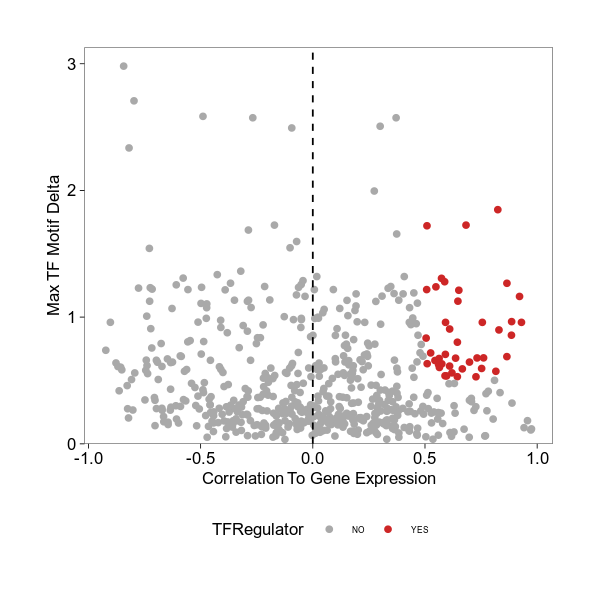

In [20]:
p <- ggplot(data.frame(corGIM_MM), aes(cor, maxDelta, color = TFRegulator)) +
  geom_point() + 
  theme_ArchR() +
  geom_vline(xintercept = 0, lty = "dashed") + 
  scale_color_manual(values = c("NO"="darkgrey", "YES"="firebrick3")) +
  xlab("Correlation To Gene Expression") +
  ylab("Max TF Motif Delta") +
  scale_y_continuous(
    expand = c(0,0), 
    limits = c(0, max(corGIM_MM$maxDelta)*1.05)
  )

p

In [ ]:
markersGIM <- getMarkerFeatures(
    ArchRProj = Merged.proj2, 
    useMatrix = "GeneIntegrationMatrix", 
    maxCells = 5000,
#      useGroups= usegroups,
    groupBy = "cluster",
    k=200,
    bias = c("TSSEnrichment", "log10(nFrags)"),
    testMethod = "wilcoxon"
)
saveRDS(markersGIM,file = "markersGIM.rds")

In [78]:
markersGIM <- readRDS("markersGIM.rds")

In [21]:
seZ

class: SummarizedExperiment 
dim: 884 4 
metadata(0):
assays(1): MotifMatrix
rownames(884): f885 f886 ... f1767 f1768
rowData names(4): seqnames idx name maxDelta
colnames(4): TP12 TP13 TP14 TP15
colData names(55): TSSEnrichment ReadsInTSS ... predictedScore_Co
  nCells

In [ ]:
#for time
rownames(markersGIM) <- rowData(markersGIM)$name
colData(markersGIM)$celltype <- colnames(markersGIM)
rownames(seZ) <- gsub("_.*","",rowData(seZ)$name)
colData(seZ)$celltype <- colData(seZ)$cluster
# saveRDS(markersGIM,file = "markersGIM.rds")
saveRDS(seZ,file="somaticcell.seZ.rds")
saveRDS(postiveTF,file="somaticcell.postiveTF.rds")
# saveRDS(variableTF,file="somaticcell.variableTF.rds")

In [80]:
rownames(markersGIM) <- rowData(markersGIM)$name
colData(markersGIM)$celltype <- colnames(markersGIM)
rownames(seZ) <- gsub("_.*","",rowData(seZ)$name)
colData(seZ)$celltype <- colData(seZ)$cluster
# saveRDS(markersGIM,file = "markersGIM.rds")
saveRDS(seZ,file="somaticcell.seZ.rds")
saveRDS(postiveTF,file="somaticcell.postiveTF.rds")
# saveRDS(variableTF,file="somaticcell.variableTF.rds")

In [1]:
markersGIM <- readRDS("markersGIM.rds")
# seZ <- readRDS("somaticcell.seZ.rds")
postiveTF <- readRDS("somaticcell.postiveTF.rds")

In [35]:
## Ploting using SETOOLS
library(SummarizedExperiment)
library(SEtools)
library(ComplexHeatmap)
library(circlize)
library(viridis)


Warning message:
“replacing previous import ‘ComplexHeatmap::pheatmap’ by ‘pheatmap::pheatmap’ when loading ‘SEtools’”
ComplexHeatmap version 2.6.2
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite:
Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
  genomic data. Bioinformatics 2016.

This message can be suppressed by:
  suppressPackageStartupMessages(library(ComplexHeatmap))


circlize version 0.4.15
CRAN page: https://cran.r-project.org/package=circlize
Github page: https://github.com/jokergoo/circlize
Documentation: https://jokergoo.github.io/circlize_book/book/

If you use it in published research, please cite:
Gu, Z. circlize implements and enhances circular visualization
  in R. Bioinformatics 2014.

This message can be suppressed by:
  suppressPackageStartupMessag

In [45]:
rownames(markersGIM) <- rowData(markersGIM)$name
colData(markersGIM)$celltype <- colnames(markersGIM)
rownames(seZ) <- gsub("_.*","",rowData(seZ)$name)
colData(seZ)$celltype <- colnames(seZ)

In [2]:
p2 <- sechm(seZ, genes=postiveTF,assayName = "MotifMatrix",do.scale=TRUE,cluster_rows = TRUE,cluster_cols = TRUE,anno_columns = "celltype",show_rownames = TRUE,show_colnames = TRUE)
p1 <- sechm(markersGIM, genes=postiveTF,assayName = "Mean",do.scale=TRUE,cluster_rows = TRUE,cluster_cols = TRUE,anno_columns = "celltype",show_rownames = TRUE,show_colnames = TRUE)
magma(5)
pal <- c("#000004FF","#51127CFF","#B63679FF","#FCFDBFFF")
pdf(file="./2022Figure/Somatic.6cluster.positiveTF.jointheatmap.TFvsmRNA.pdf",width=6,height=6)
crossHm(list(SE1=seZ, SE2=markersGIM), hmcols= c("navy","white","orange2"), postiveTF,do.scale = TRUE,cluster_rows = TRUE,
        cluster_cols = FALSE,show_rownames=TRUE,
        show_colnames =FALSE,row_names_gp = gpar(fontsize = 10),anno_columns= c("celltype","celltype"))
dev.off()

## UMAP of positivie regulators

In [13]:
motifs <- c("Sox9","Dmrt1","Tcf21","Gata4","Nr5a1","TEAD4","Lmx1a","Lef1","Ets1","Fli1")
markerMotifs <- getFeatures(Merged.proj2, select = paste(motifs, collapse="|"), useMatrix = "MotifMatrix")
markerMotifs

[1] "z:Tead4_868"          "z:Nr5a1_848"          "z:Lef1_734"          
 [4] "z:Sox9_725"           "z:Lmx1a_456"          "z:Gata4_386"         
 [7] "z:Ets1_284"           "z:Fli1_277"           "z:Dmrt1_251"         
[10] "z:Tcf21_79"           "deviations:Tead4_868" "deviations:Nr5a1_848"
[13] "deviations:Lef1_734"  "deviations:Sox9_725"  "deviations:Lmx1a_456"
[16] "deviations:Gata4_386" "deviations:Ets1_284"  "deviations:Fli1_277" 
[19] "deviations:Dmrt1_251" "deviations:Tcf21_79"

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2d142f1c7ce-Date-2022-08-07_Time-20-04-15.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-08-07 20:04:16 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2d142f1c7ce-Date-2022-08-07_Time-20-04-15.log



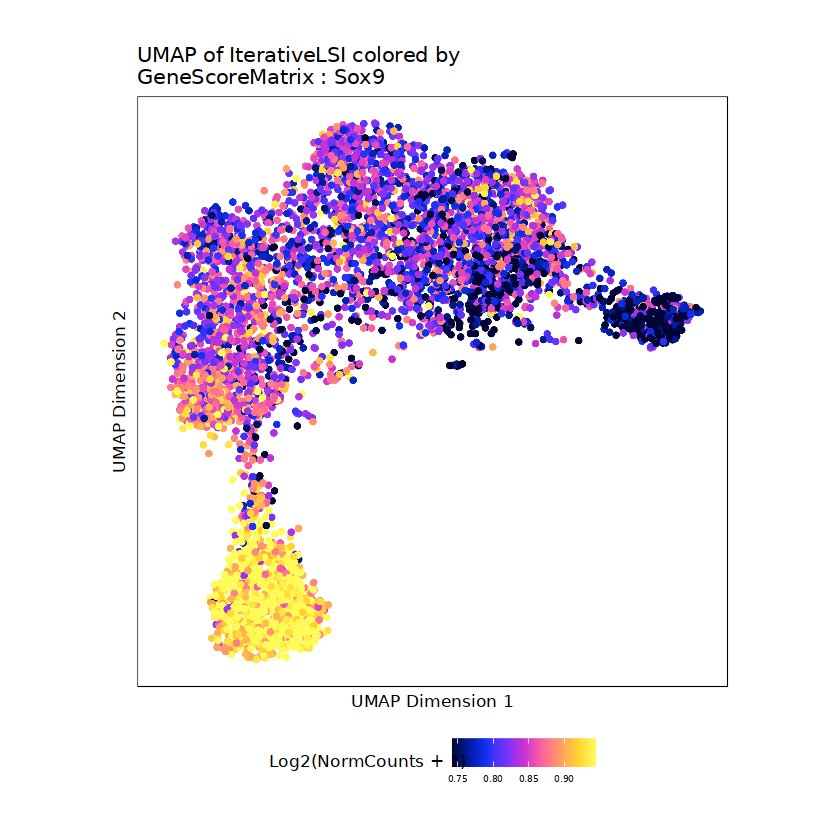

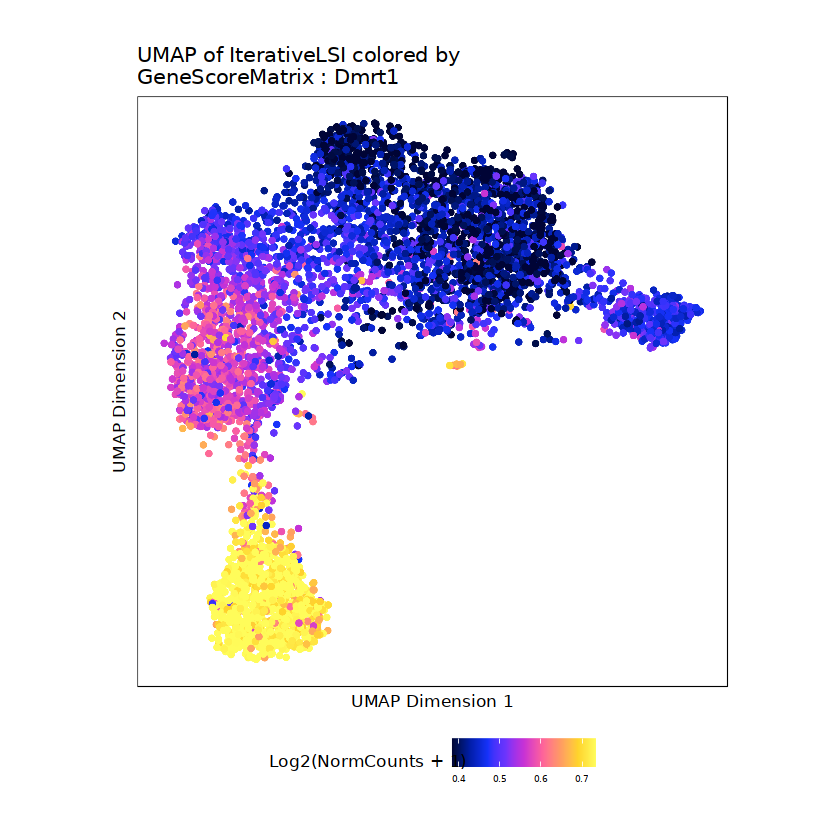

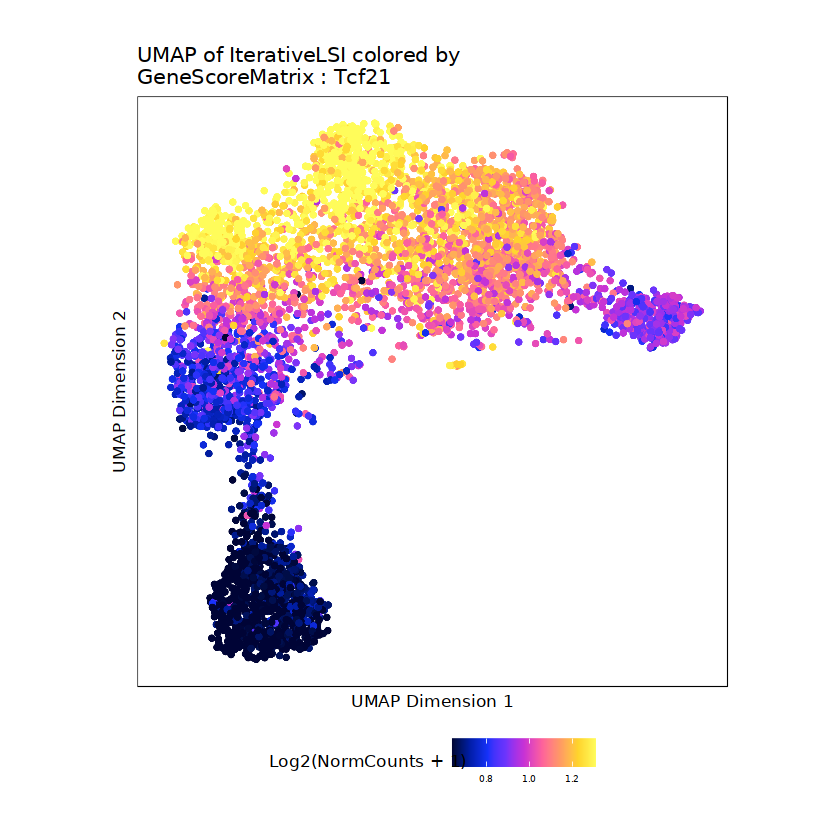

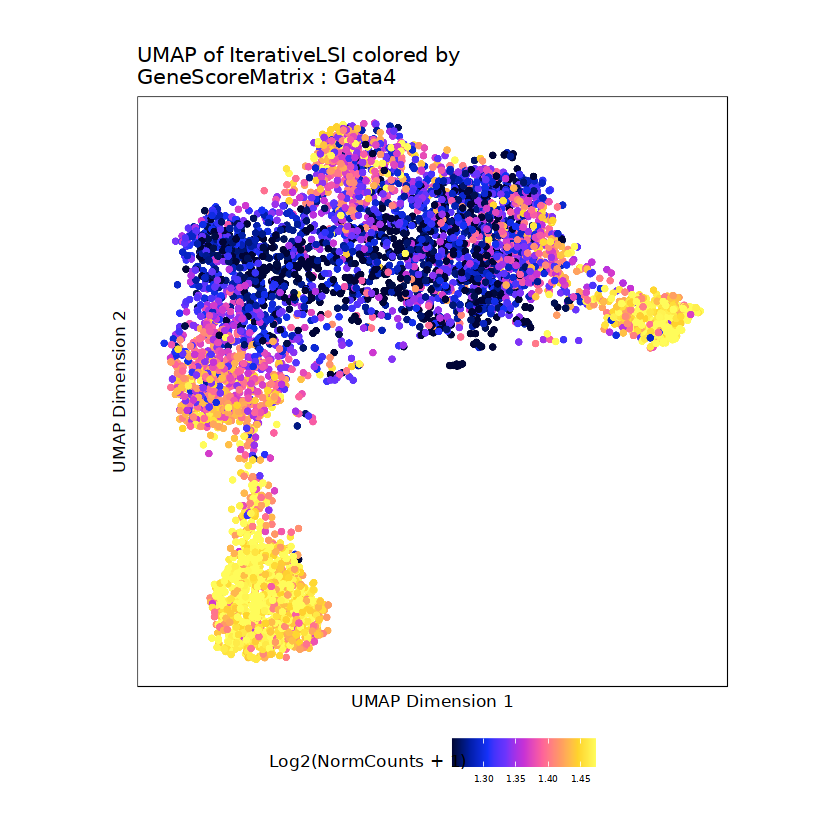

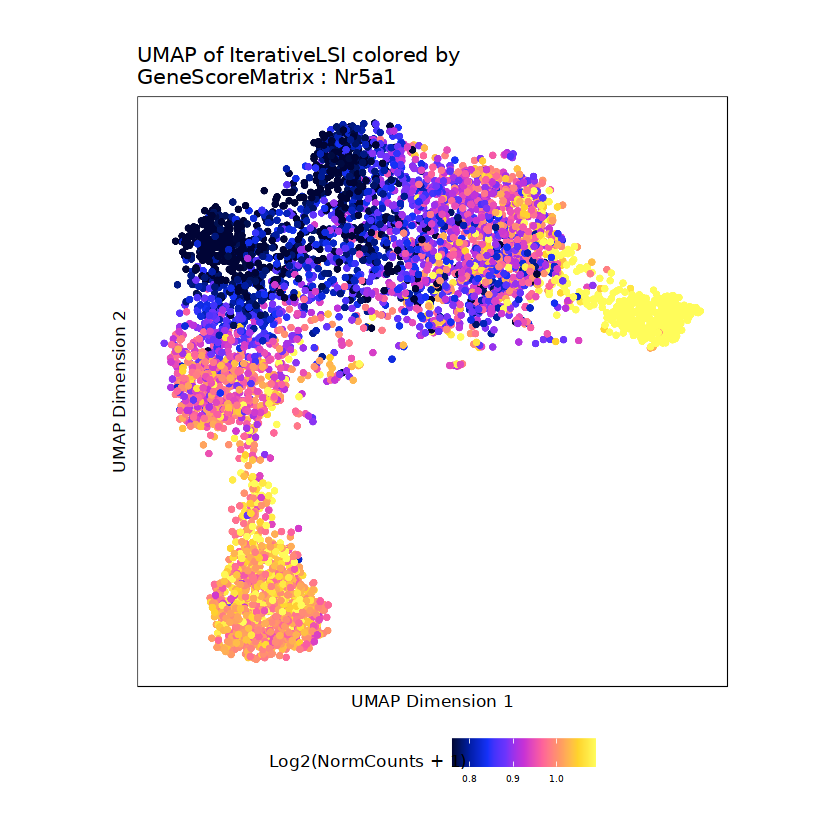

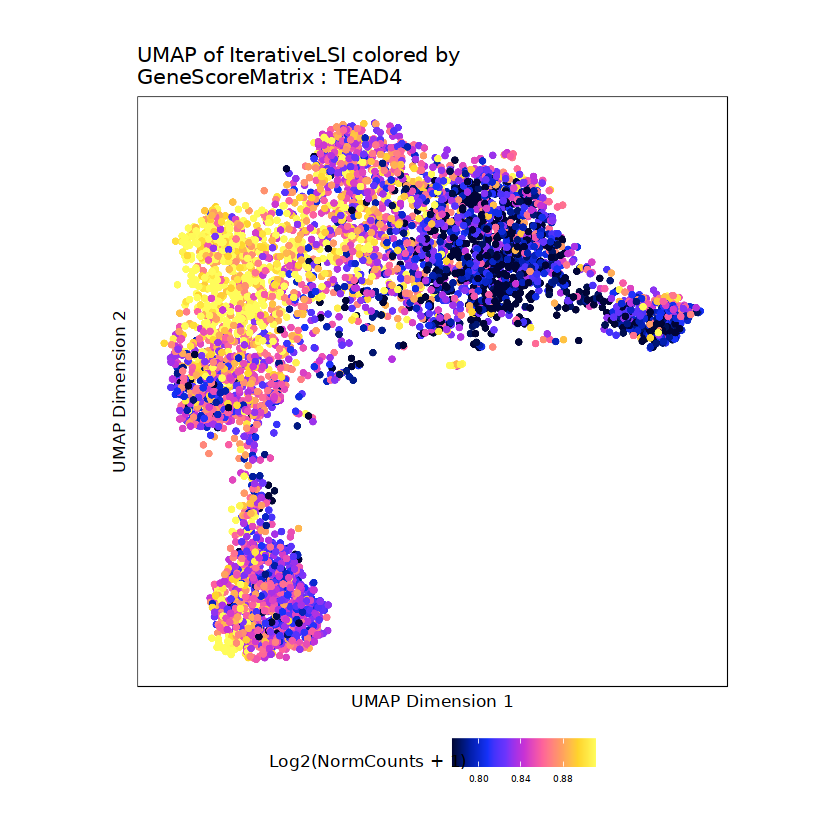

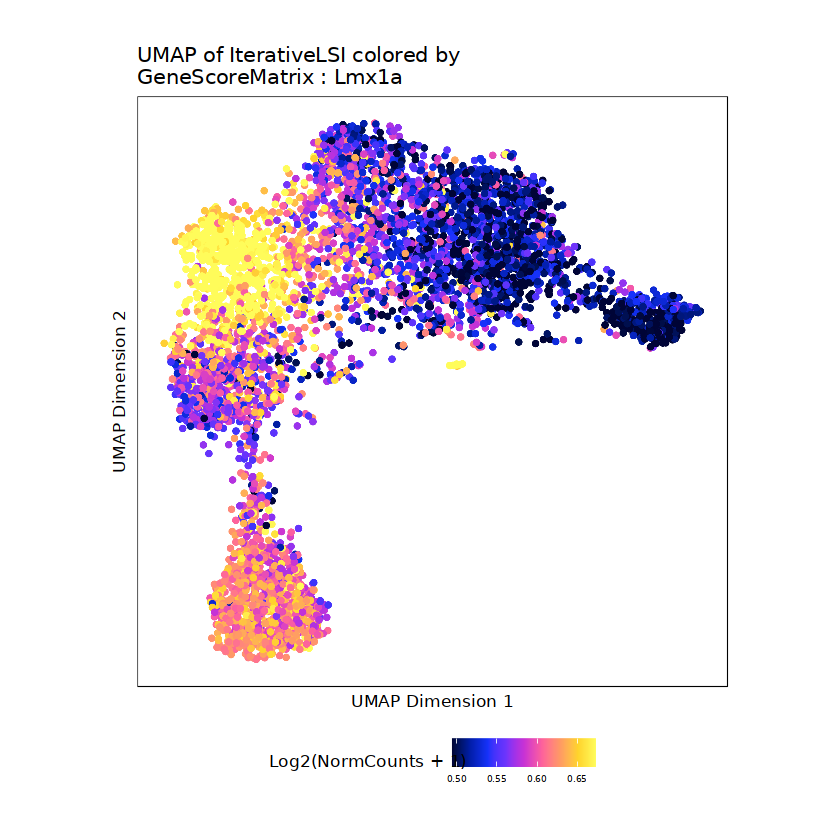

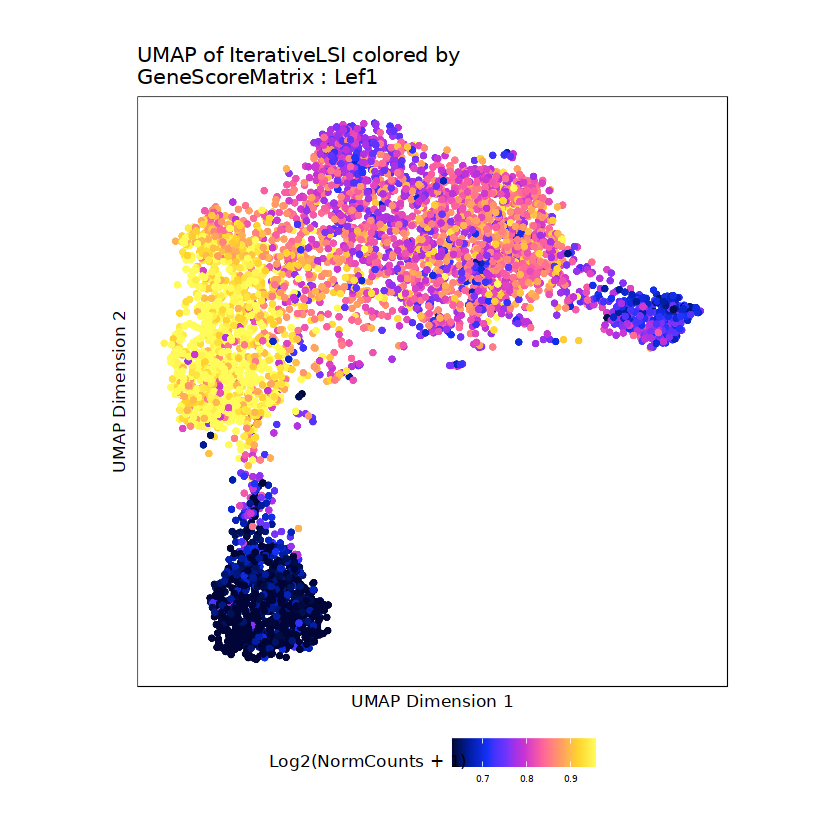

$Sox9

$Dmrt1

$Tcf21

$Gata4

$Nr5a1

$TEAD4

$Lmx1a

$Lef1

$Ets1

$Fli1


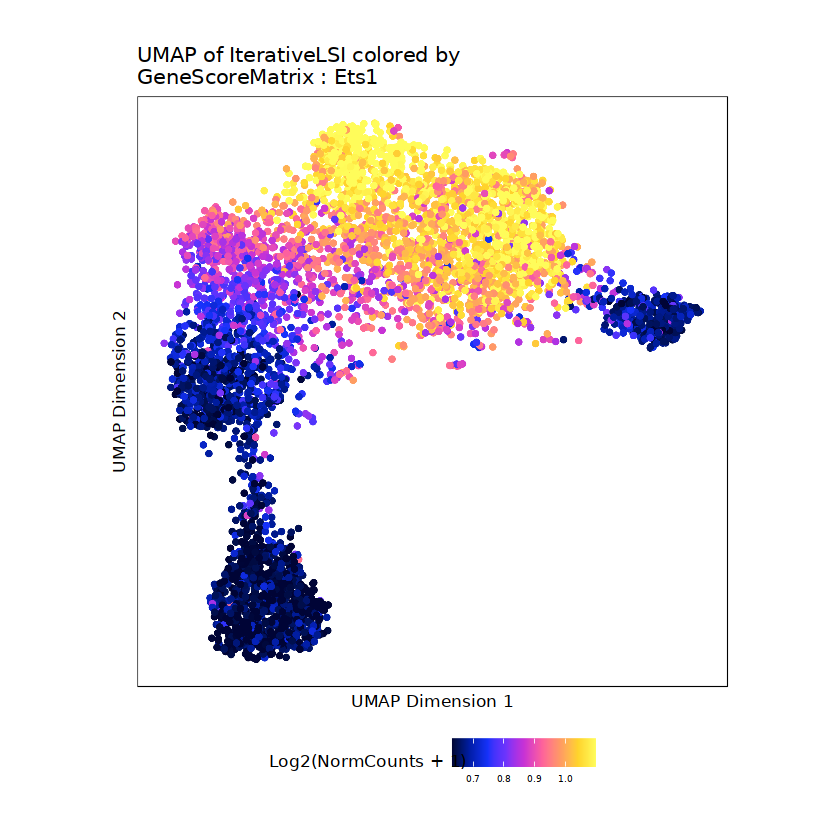

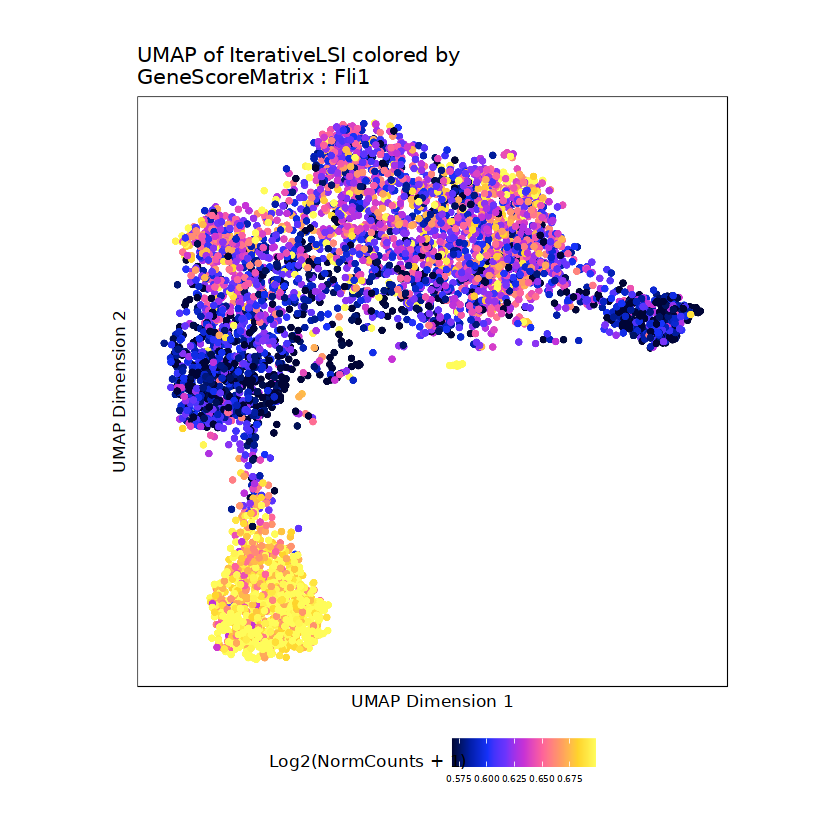

In [58]:
plotEmbedding(ArchRProj = Merged.proj2,  colorBy = "GeneScoreMatrix", 
              name = c("Sox9","Dmrt1","Tcf21","Gata4","Nr5a1","TEAD4","Lmx1a","Lef1","Ets1","Fli1"), 
              embedding = "UMAP",size = 2,
                    pal = ArchRPalettes$horizonExtra,
              plotAs = "points",
                    imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2d143497b8b1-Date-2022-08-07_Time-20-07-52.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneIntegrationMatrix

Getting Matrix Values...

2022-08-07 20:07:53 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2d143497b8b1-Date-2022-08-07_Time-20-07-52.log



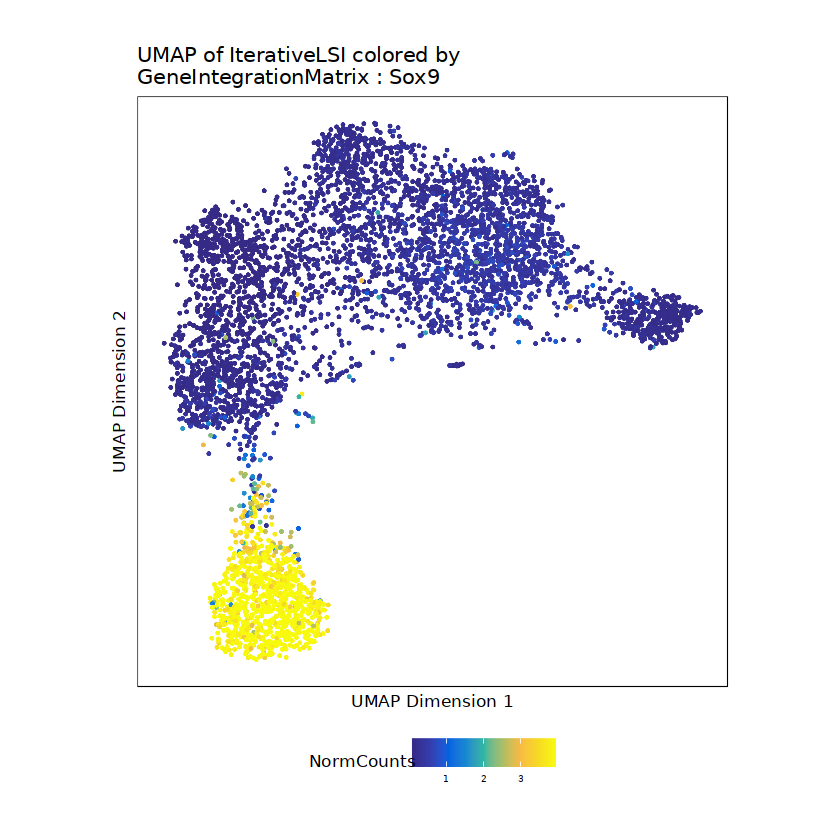

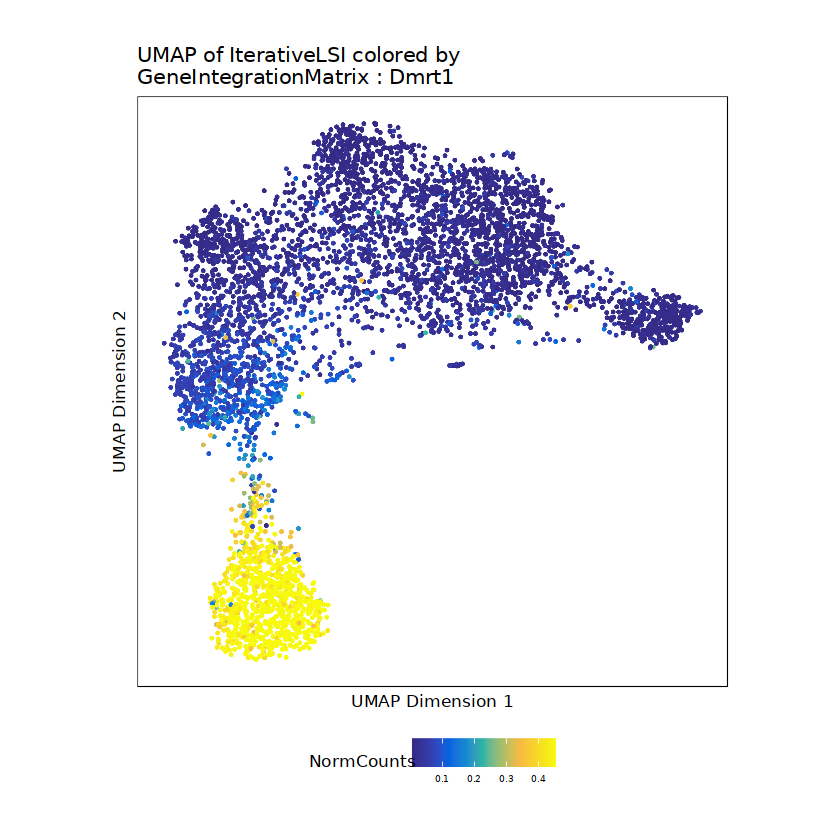

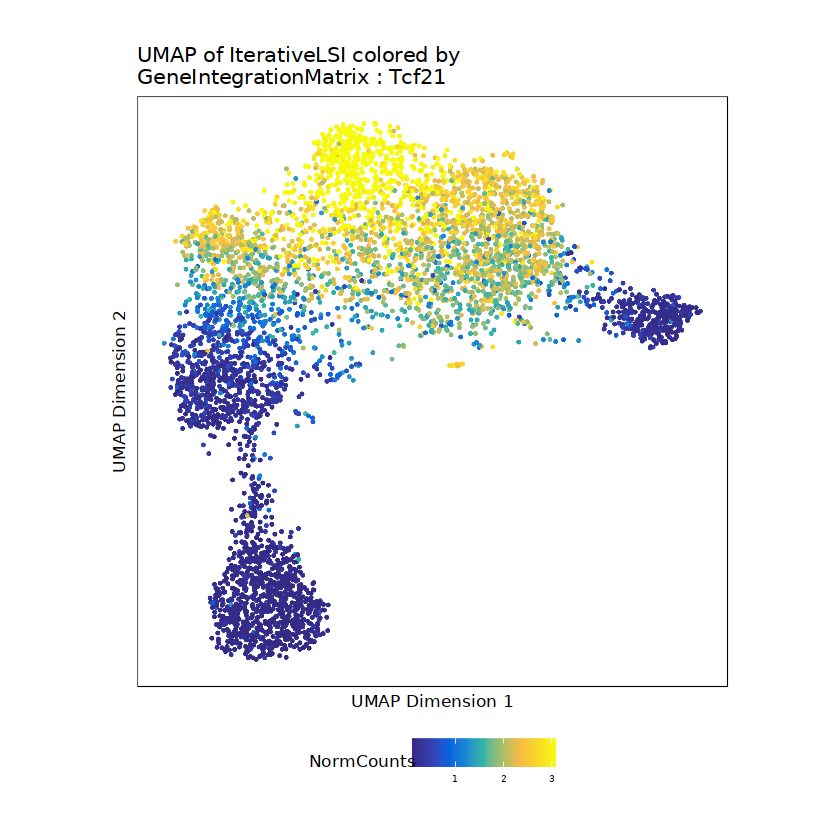

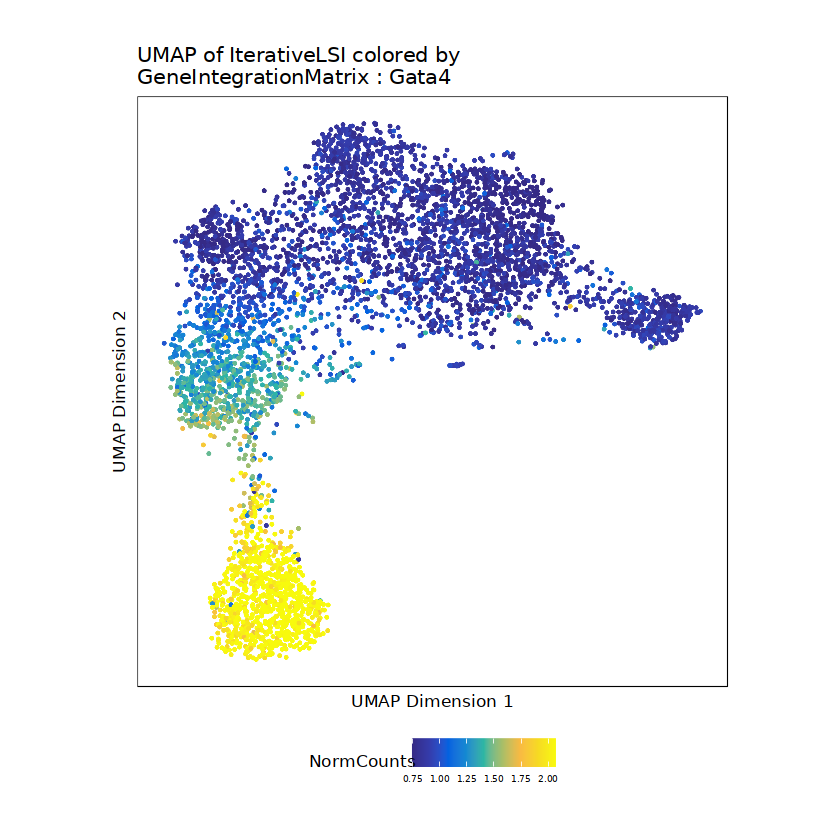

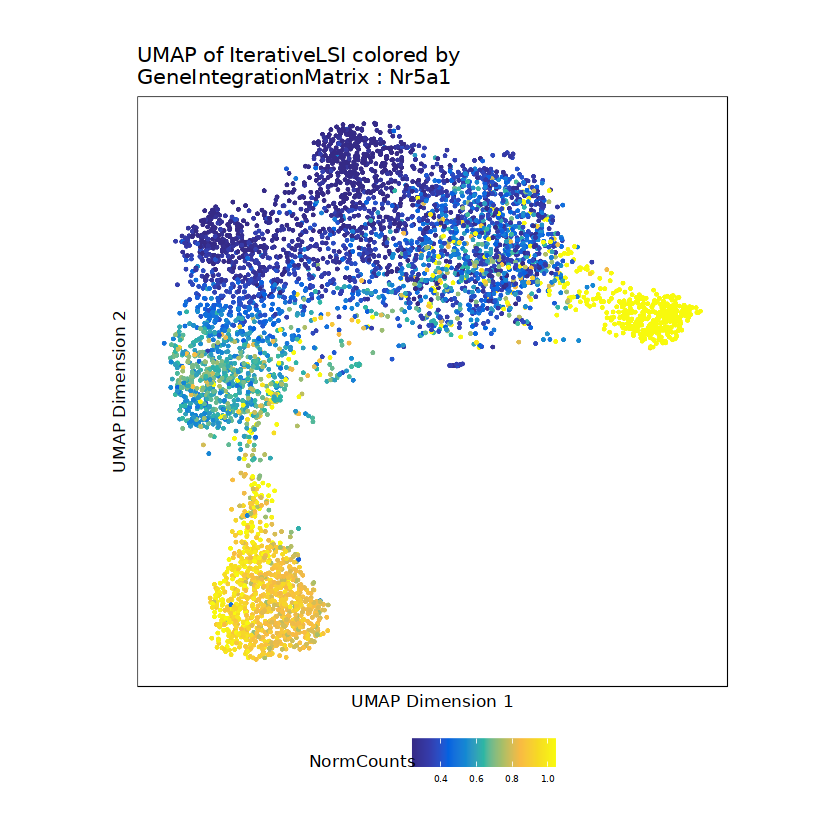

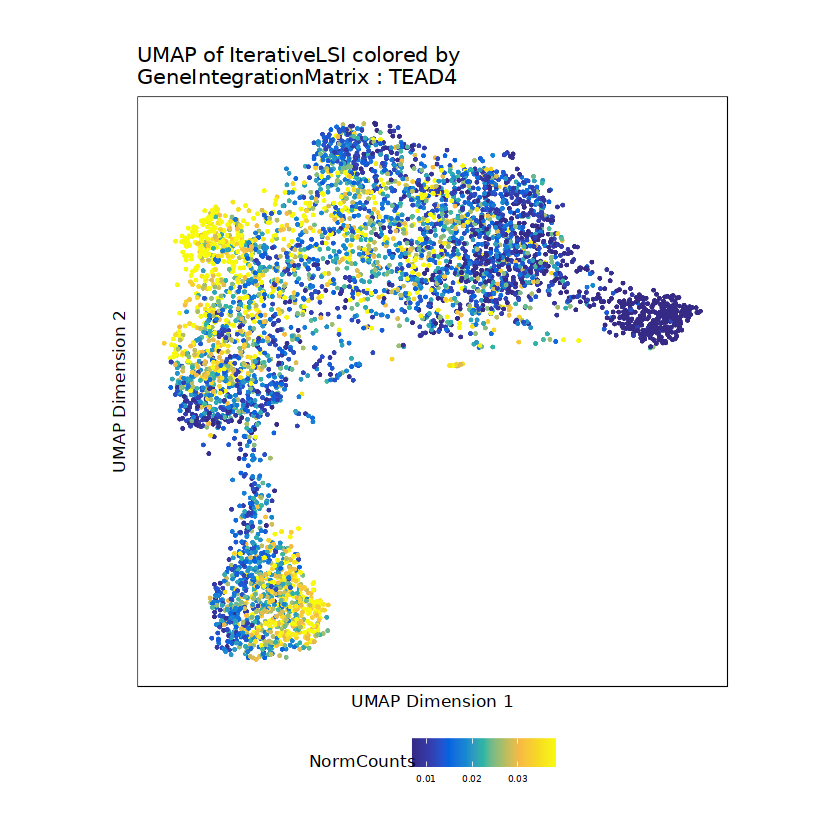

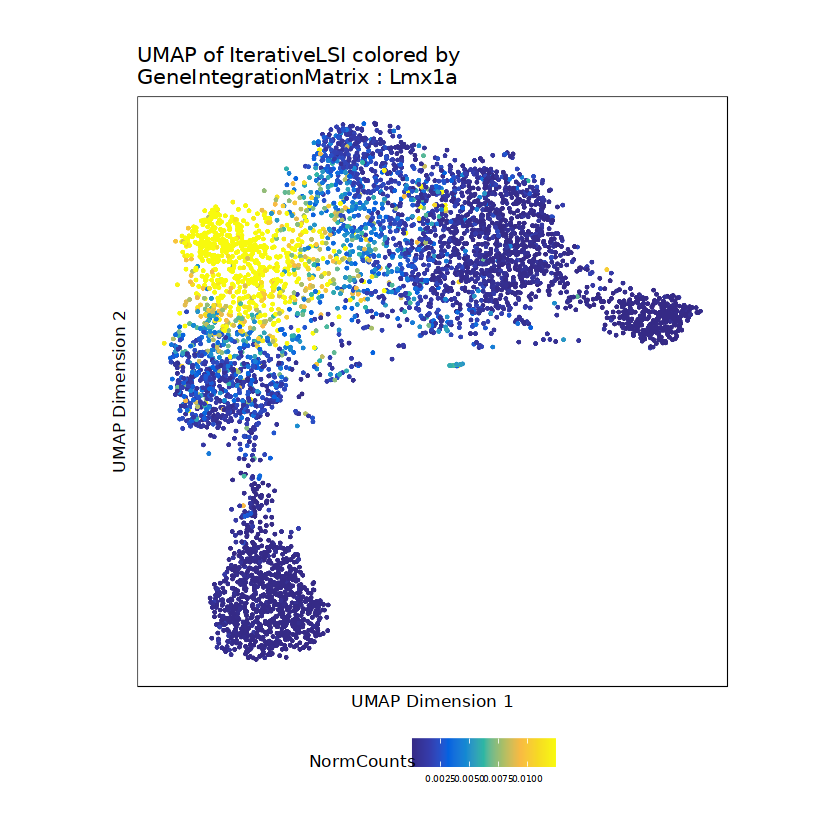

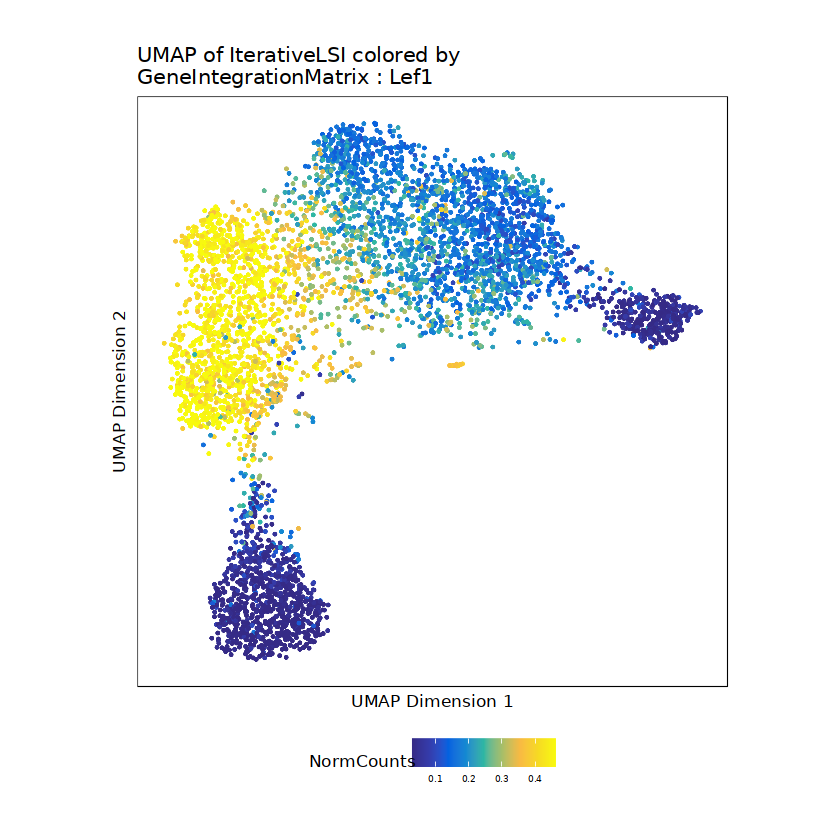

$Sox9

$Dmrt1

$Tcf21

$Gata4

$Nr5a1

$TEAD4

$Lmx1a

$Lef1

$Ets1

$Fli1


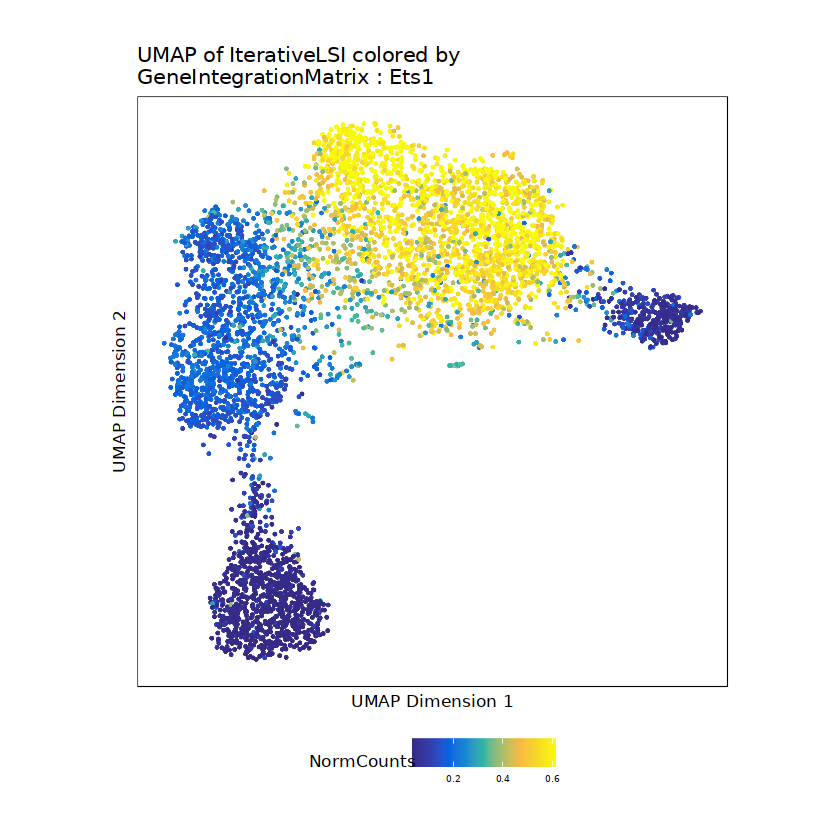

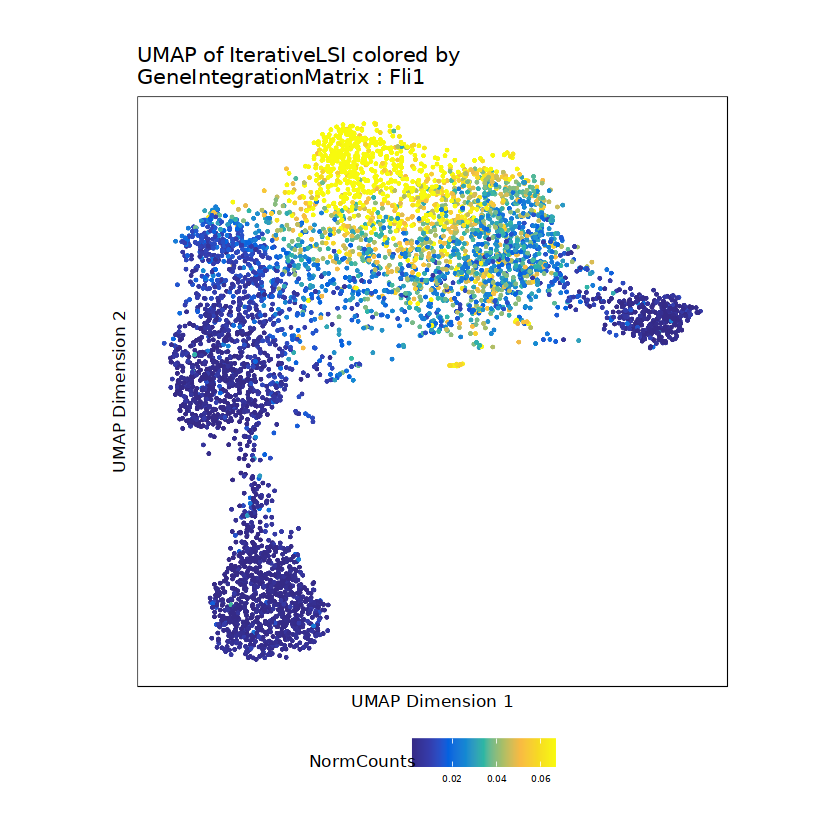

In [62]:
plotEmbedding(ArchRProj = Merged.proj2,  colorBy = "GeneIntegrationMatrix", 
              name = c("Sox9","Dmrt1","Tcf21","Gata4","Nr5a1","TEAD4","Lmx1a","Lef1","Ets1","Fli1"), 
              embedding = "UMAP",size = 1,
                         pal = ArchRPalettes$blueYellow,
              plotAs = "points",                   
                    imputeWeights = getImputeWeights(Merged.proj2),
                         quantCut = c(0.1, 0.9)
                        )

In [69]:
GSplot <- plotEmbedding(ArchRProj = Merged.proj2,  colorBy = "GeneScoreMatrix", 
              name = c("Sox9","Dmrt1","Tcf21","Gata4","Nr5a1","TEAD4","Lmx1a","Lef1","Ets1","Fli1"), 
              embedding = "UMAP",size = 1,
#                     pal = ArchRPalettes$solarExtra,
                        plotAs = "points",
                    imputeWeights = getImputeWeights(Merged.proj2),quantCut = c(0.1, 0.9))

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2d145f59cf20-Date-2022-08-07_Time-20-12-24.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-08-07 20:12:25 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2d145f59cf20-Date-2022-08-07_Time-20-12-24.log



In [75]:
GIMplot <- plotEmbedding(ArchRProj = Merged.proj2,  colorBy = "GeneIntegrationMatrix", 
              name = c("Sox9","Dmrt1","Tcf21","Gata4","Nr5a1","TEAD4","Lmx1a","Lef1","Ets1","Fli1"), 
              embedding = "UMAP",size = 1,
                         pal = ArchRPalettes$blueYellow,
              plotAs = "points",                   
                    imputeWeights = getImputeWeights(Merged.proj2),
                         quantCut = c(0.1, 0.9)
                        )

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2d1447ee04f6-Date-2022-08-07_Time-20-13-48.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneIntegrationMatrix

Getting Matrix Values...

2022-08-07 20:13:50 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2d1447ee04f6-Date-2022-08-07_Time-20-13-48.log



In [71]:
MMplot <- plotEmbedding(ArchRProj = Merged.proj2, colorBy = "MotifMatrix", 
                        name =c ('z:Sox9_725','z:Dmrt1_251', 'z:Tcf21_79','z:Gata4_386','z:Nr5a1_848','z:Tead4_868',
                                                                          'z:Lmx1a_456',"z:Lef1_734",
                                                                                    "z:Ets1_284","z:Fli1_277"), embedding = "UMAP",
                        size = 1, imputeWeights = getImputeWeights(Merged.proj2),
                        plotAs = "points",
                        quantCut = c(0.1, 0.9)
                       )



Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-2d143b1a5af3-Date-2022-08-07_Time-20-12-40.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = MotifMatrix

Getting Matrix Values...

2022-08-07 20:12:42 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-2d143b1a5af3-Date-2022-08-07_Time-20-12-40.log



Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = F

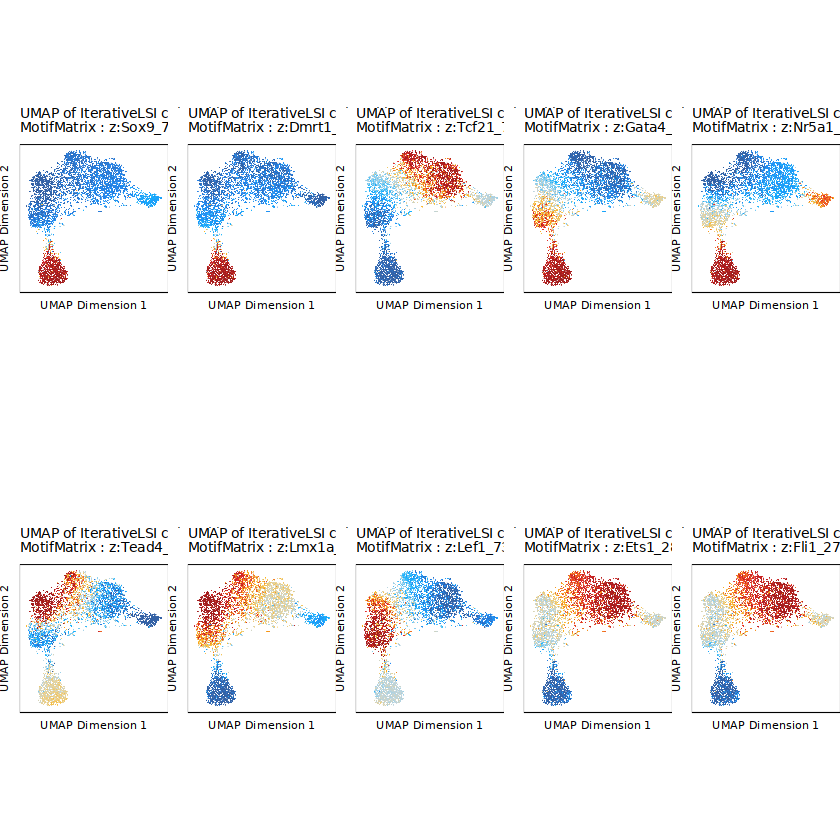

In [76]:
p1 <- lapply(MMplot, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 5),p1))

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = F

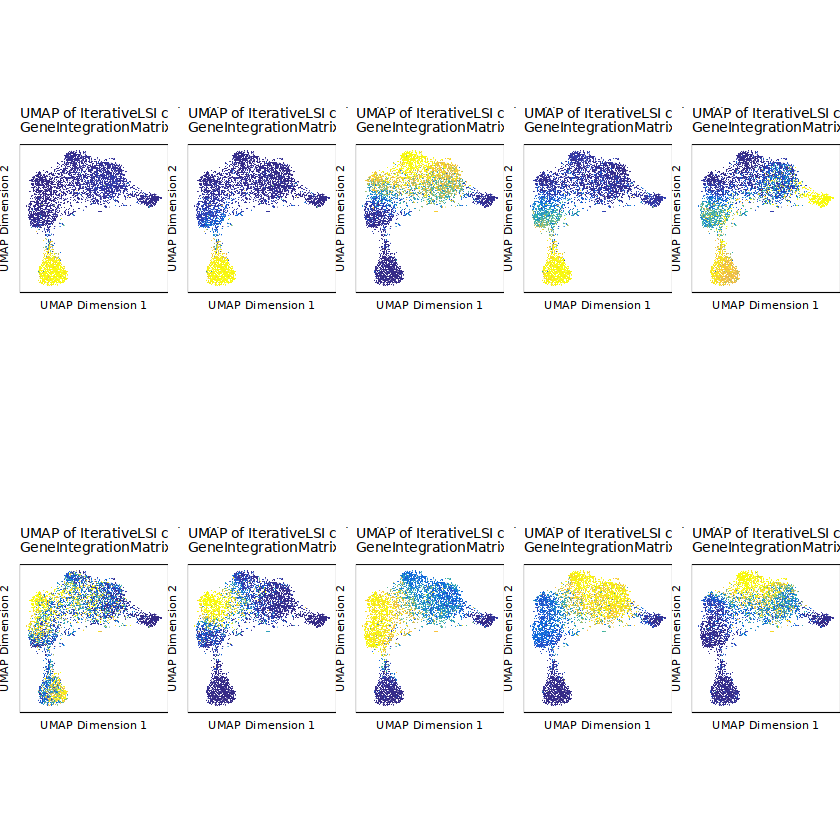

In [77]:
p3 <- lapply(GIMplot, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 5),p3))

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
Warning message:
“`guides(<scale> = F

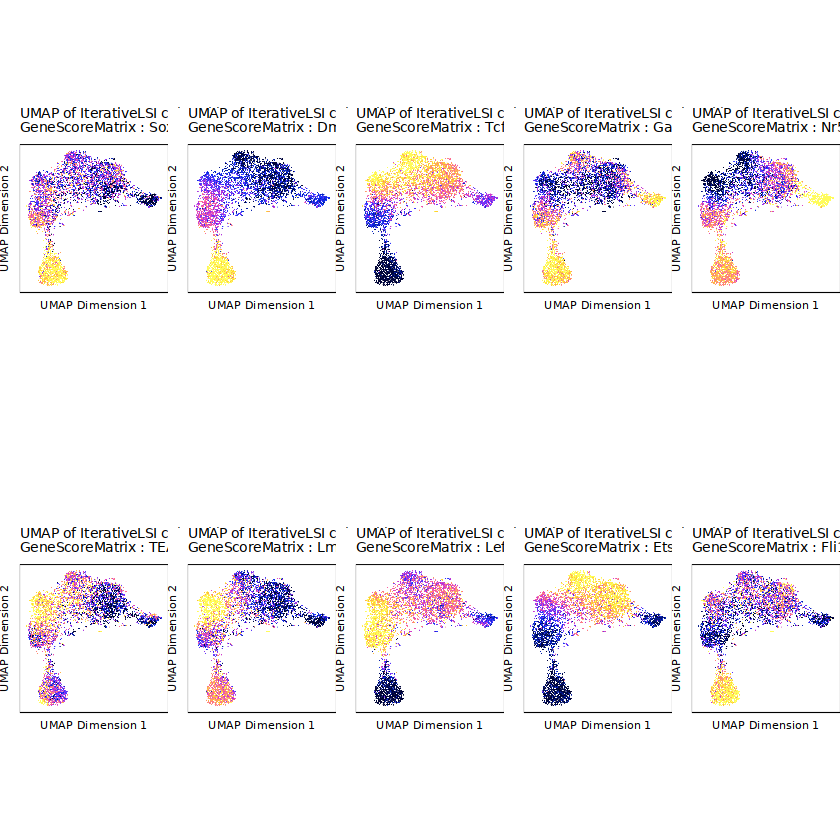

In [78]:
p2 <- lapply(GSplot, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 5),p2))

In [79]:
pdf("./2022Figure/somatic.positiveTF.UMAP.pdf",height = 6,width = 12)
do.call(cowplot::plot_grid, c(list(ncol = 5),p1))
do.call(cowplot::plot_grid, c(list(ncol = 5),p2))
dev.off()

png 
  2

In [39]:
seRNA=RenameIdents(seRNA,"0" = "Interstitial/Stromal", 
                      "1" = "Pre-granulosa",
                     "2" = "CE",
                     "3"= "Pre-Sertoli",
                     "4"= "Bipotent",
                      "5" = "Steroidogenic")
seRNA@meta.data$celltype <- Idents(seRNA)

In [52]:
pdf("./2022Figure/somatic.positiveTF.scRNAseq.plot.pdf",width=12,height =5)
options(repr.plot.width=12, repr.plot.height=5)
FeaturePlot(seRNA, features = c("Sox9","Dmrt1","Tcf21","Gata4","Nr5a1","Tead4","Lmx1a","Lef1","Ets1","Fli1"),  pt.size=0.1,  ncol=5 ,order = TRUE)
VlnPlot(seRNA, features = c("Sox9","Dmrt1","Tcf21","Gata4","Nr5a1","Tead4","Lmx1a","Lef1","Ets1","Fli1"),  pt.size=0.1,ncol=5)
DotPlot(seRNA, features = c("Sox9","Dmrt1","Tcf21","Gata4","Nr5a1","Tead4","Lmx1a","Lef1","Ets1","Fli1"))
dev.off()

png 
  2

## Final browser plot 

In [ ]:
# known enhancer 
# chr2	105073942	105074968	Wt1	1	.
# chr11	112768961	112772121	Sox9_TES	1	.
# chr11	112769652	112770944	Sox9_TESCO	1	.
# chr2	38718765	38718860	FLE	1	.

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-e5f44c5da229-Date-2022-03-23_Time-15-48-21.log
If there is an issue, please report to github with logFile!

2022-03-23 15:48:21 : Validating Region, 0.007 mins elapsed.



GRanges object with 1 range and 2 metadata columns:
      seqnames            ranges strand |     gene_id      symbol
         <Rle>         <IRanges>  <Rle> | <character> <character>
  [1]     chr2 38692656-38714542      - |       26423       Nr5a1
  -------
  seqinfo: 21 sequences from mm10 genome


2022-03-23 15:48:21 : Adding Bulk Tracks (1 of 1), 0.008 mins elapsed.

Getting Region From Arrow Files 1 of 4

Getting Region From Arrow Files 2 of 4

Getting Region From Arrow Files 3 of 4

Getting Region From Arrow Files 4 of 4

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-03-23 15:48:23 : Adding Feature Tracks (1 of 1), 0.033 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-03-23 15:48:23 : Adding Loop Tracks (1 of 1), 0.036 mins elapsed.

2022-03-23 15:48:23 : Adding Gene Tracks (1 of 1), 0.039 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-03-23 15:48:23 : Plotting, 0.042 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotBrowserTrack-e5f44c5da229-Date-2022-03-23_Time-15-48-21.log



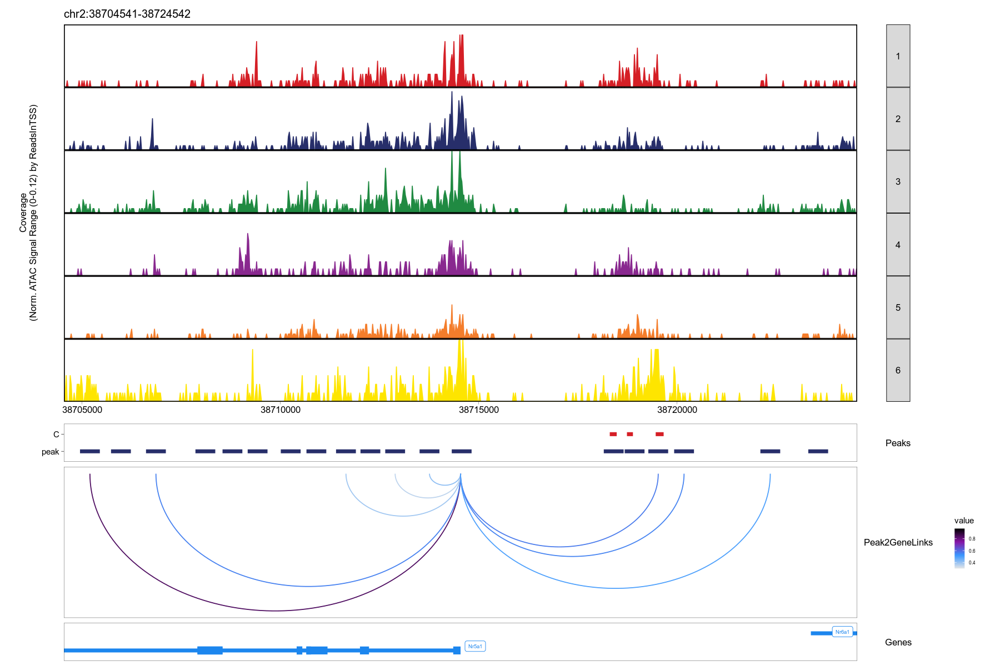

In [70]:
# Plot Nr5a1 fetal enhancer
p <- plotBrowserTrack(
    ArchRProj = Merged.proj2, 
    groupBy = "cluster", 
        geneSymbol = "Nr5a1", 
    
features = GRangesList(FLE = GRanges(c("chr2:38719462-38719662","chr2:38718737-38718888","chr2:38718304-38718479")),
#                        TrackB = ("chr2:105120673-105132509"),
    peak =getPeakSet(Merged.proj2)),
    upstream = 10000,
    downstream = 10000,
         tileSize = 25,
    loops = getPeak2GeneLinks(Merged.proj2,corCutOff = 0.3,
       FDRCutOff = 0.05,resolution = 1),
        sizes = c(5, 0.5, 2, 0.5),

  log2Norm = TRUE,

  minCells = 25,
  normMethod = "ReadsInTSS",
  ylim = NULL,
  pal = NULL,
  baseSize = 10,
  scTileSize = 0.5,
  scCellsMax = 100,
  borderWidth =2,
  tickWidth = 0.2,
  facetbaseSize = 10,
    
)
options(repr.plot.width=15
       )
grid::grid.newpage()
grid::grid.draw(p[[1]])

In [87]:
p2g.heatmap.addtss.df <- read.csv("./2022Figure/somatic.p2g.heatmap.6cluster.list.csv")
p2g.heatmap.addtss.df  %>% dplyr::filter(gene == "Sox9") 

#     filter(cluster == "5") %>%
#     dplyr::select(peak) %>% separate(peak,c("chr","start","end")) %>% GRanges

X,idxATAC,idxRNA,Correlation,FDR,VarQATAC,VarQRNA,peak,gene,cluster,seqnames,start,end
<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<int>,<chr>,<int>,<int>
979,91261,3093,0.5696850,1.064978e-42,0.6097485,0.997095,chr11:112779303-112779803,Sox9,5,chr11,112782210,112782211
11076,91278,3093,0.8927061,2.969329e-170,0.9722794,0.997095,chr11:112850000-112850500,Sox9,4,chr11,112782210,112782211
11806,91259,3093,0.7136171,1.422346e-76,0.8940380,0.997095,chr11:112772789-112773289,Sox9,4,chr11,112782210,112782211
13553,91258,3093,0.8670433,6.554901e-149,0.8365591,0.997095,chr11:112770416-112770916,Sox9,4,chr11,112782210,112782211
13725,91257,3093,0.9070265,1.288907e-184,0.6585503,0.997095,chr11:112769800-112770300,Sox9,4,chr11,112782210,112782211
14000,91260,3093,0.5890779,2.775729e-46,0.5484461,0.997095,chr11:112773432-112773932,Sox9,4,chr11,112782210,112782211
14544,91270,3093,0.7440896,1.214619e-86,0.7233576,0.997095,chr11:112802772-112803272,Sox9,4,chr11,112782210,112782211
15267,91252,3093,0.6131359,4.398445e-51,0.3058820,0.997095,chr11:112568357-112568857,Sox9,4,chr11,112782210,112782211
15398,91279,3093,0.7790132,4.106235e-100,0.6136758,0.997095,chr11:112850524-112851024,Sox9,4,chr11,112782210,112782211


ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-3dd631fc403f-Date-2022-04-01_Time-09-25-57.log
If there is an issue, please report to github with logFile!

2022-04-01 09:25:58 : Validating Region, 0.009 mins elapsed.



GRanges object with 1 range and 2 metadata columns:
      seqnames            ranges strand |     gene_id      symbol
         <Rle>         <IRanges>  <Rle> | <character> <character>
  [1]     chr2 38692656-38714542      - |       26423       Nr5a1
  -------
  seqinfo: 21 sequences from mm10 genome


2022-04-01 09:25:58 : Adding Bulk Tracks (1 of 1), 0.011 mins elapsed.

Getting Region From Arrow Files 1 of 4

Getting Region From Arrow Files 2 of 4

Getting Region From Arrow Files 3 of 4

Getting Region From Arrow Files 4 of 4

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-04-01 09:26:15 : Adding Feature Tracks (1 of 1), 0.294 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-04-01 09:26:15 : Adding Loop Tracks (1 of 1), 0.297 mins elapsed.

2022-04-01 09:26:15 : Adding Gene Tracks (1 of 1), 0.3 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-04-01 09:26:16 : Plotting, 0.305 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotBrowserTrack-3dd631fc403f-Date-2022-04-01_Time-09-25-57.log



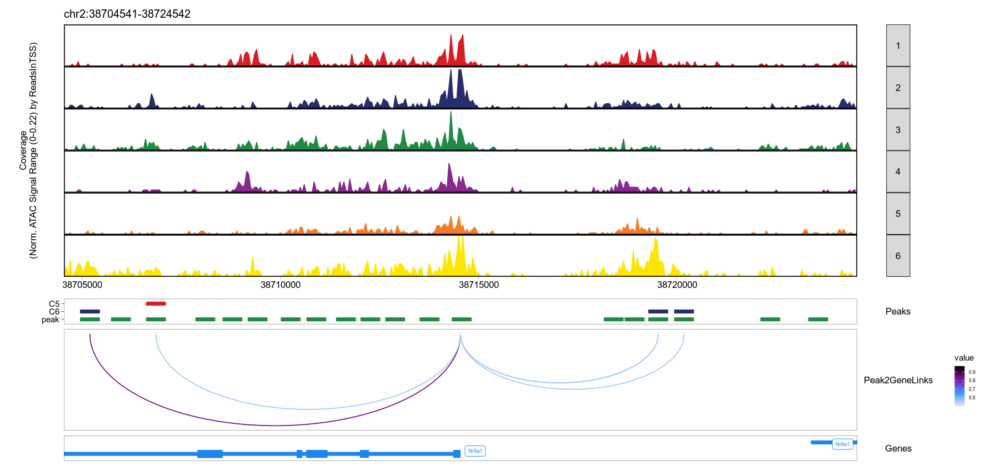

In [12]:
# Plot Nr5a1 fetal enhancer
p <- plotBrowserTrack(
    ArchRProj = Merged.proj2, 
    groupBy = "cluster", 
        geneSymbol = "Nr5a1", 
    
features = GRangesList(C5 = p2g.heatmap.addtss.df  %>% dplyr::filter(gene == "Nr5a1") %>% 
    filter(cluster == "5") %>%
    dplyr::select(peak) %>% separate(peak,c("chr","start","end")) %>% GRanges,
                       C6 = p2g.heatmap.addtss.df  %>% dplyr::filter(gene == "Nr5a1") %>% 
    filter(cluster == "6") %>%
    dplyr::select(peak) %>% separate(peak,c("chr","start","end")) %>% GRanges,
#                        TrackB = ("chr2:105120673-105132509"),
    peak =getPeakSet(Merged.proj2)),
    upstream = 10000,
    downstream = 10000,
         tileSize = 50,
    loops = getPeak2GeneLinks(Merged.proj2,
                              corCutOff = 0.5,
#        FDRCutOff = 0.05,resolution = 1
                             ),
        sizes = c(5, 0.5, 2, 0.5),

  log2Norm = TRUE,

  minCells = 50,
  normMethod = "ReadsInTSS",
  ylim = NULL,
  pal = NULL,
  baseSize = 10,
  scTileSize = 0.5,
  scCellsMax = 100,
  borderWidth =2,
  tickWidth = 0.2,
  facetbaseSize = 10,
    
)
options(repr.plot.width=15
       )
grid::grid.newpage()
grid::grid.draw(p[[1]])

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-3dd646872558-Date-2022-04-01_Time-09-27-14.log
If there is an issue, please report to github with logFile!

2022-04-01 09:27:14 : Validating Region, 0.007 mins elapsed.



GRanges object with 1 range and 2 metadata columns:
      seqnames            ranges strand |     gene_id      symbol
         <Rle>         <IRanges>  <Rle> | <character> <character>
  [1]     chr2 38692656-38714542      - |       26423       Nr5a1
  -------
  seqinfo: 21 sequences from mm10 genome


2022-04-01 09:27:14 : Adding Bulk Tracks (1 of 1), 0.008 mins elapsed.

Getting Region From Arrow Files 1 of 4

Getting Region From Arrow Files 2 of 4

Getting Region From Arrow Files 3 of 4

Getting Region From Arrow Files 4 of 4

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-04-01 09:27:16 : Adding Feature Tracks (1 of 1), 0.034 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-04-01 09:27:16 : Adding Loop Tracks (1 of 1), 0.037 mins elapsed.

2022-04-01 09:27:16 : Adding Gene Tracks (1 of 1), 0.042 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-04-01 09:27:16 : Plotting, 0.045 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotBrowserTrack-3dd646872558-Date-2022-04-01_Time-09-27-14.log



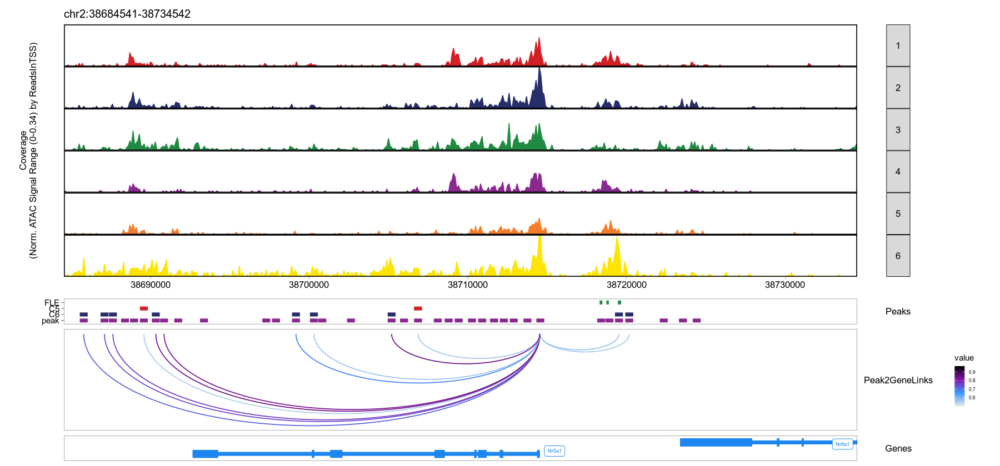

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-e5f415ef54a-Date-2022-03-23_Time-17-15-19.log
If there is an issue, please report to github with logFile!

2022-03-23 17:15:19 : Validating Region, 0.007 mins elapsed.



GRanges object with 1 range and 2 metadata columns:
      seqnames            ranges strand |     gene_id      symbol
         <Rle>         <IRanges>  <Rle> | <character> <character>
  [1]     chr1 74771892-74785319      + |       22420        Wnt6
  -------
  seqinfo: 21 sequences from mm10 genome


2022-03-23 17:15:19 : Adding Bulk Tracks (1 of 1), 0.009 mins elapsed.

Getting Region From Arrow Files 1 of 4

Getting Region From Arrow Files 2 of 4

Getting Region From Arrow Files 3 of 4

Getting Region From Arrow Files 4 of 4

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-03-23 17:15:21 : Adding Feature Tracks (1 of 1), 0.035 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-03-23 17:15:21 : Adding Loop Tracks (1 of 1), 0.039 mins elapsed.

2022-03-23 17:15:21 : Adding Gene Tracks (1 of 1), 0.043 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-03-23 17:15:21 : Plotting, 0.046 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotBrowserTrack-e5f415ef54a-Date-2022-03-23_Time-17-15-19.log



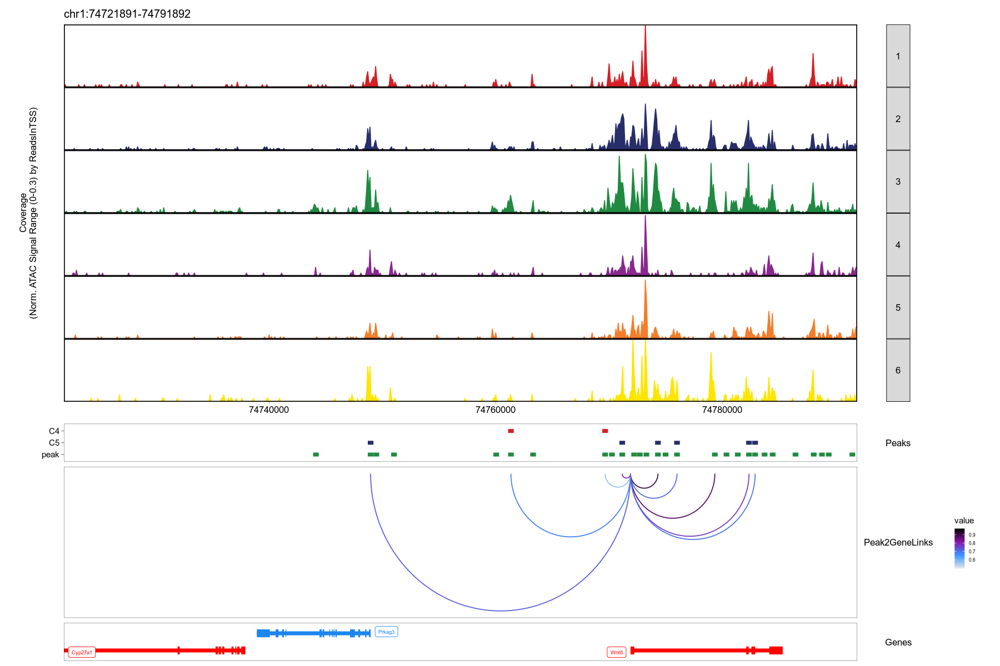

In [103]:
# Plot Nr5a1 fetal enhancer
p <- plotBrowserTrack(
    ArchRProj = Merged.proj2, 
    groupBy = "cluster", 
        geneSymbol = "Wnt6", 
    
features = GRangesList(C4 = p2g.heatmap.addtss.df  %>% dplyr::filter(gene == "Wnt6") %>% 
    filter(cluster == "4") %>%
    dplyr::select(peak) %>% separate(peak,c("chr","start","end")) %>% GRanges,
                       C5 = p2g.heatmap.addtss.df  %>% dplyr::filter(gene == "Wnt6") %>% 
    filter(cluster == "5") %>%
    dplyr::select(peak) %>% separate(peak,c("chr","start","end")) %>% GRanges,
#                        TrackB = ("chr2:105120673-105132509"),
    peak =getPeakSet(Merged.proj2)),
    upstream = 50000,
    downstream = 20000,
         tileSize = 100,
    loops = getPeak2GeneLinks(Merged.proj2,
                              corCutOff = 0.5,
#        FDRCutOff = 0.05,resolution = 1
                             ),
        sizes = c(5, 0.5, 2, 0.5),

  log2Norm = TRUE,

  minCells = 50,
  normMethod = "ReadsInTSS",
  ylim = NULL,
  pal = NULL,
  baseSize = 10,
  scTileSize = 0.5,
  scCellsMax = 100,
  borderWidth =2,
  tickWidth = 0.2,
  facetbaseSize = 10,
    
)
options(repr.plot.width=15
       )
grid::grid.newpage()
grid::grid.draw(p[[1]])

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-3dd6d5b6649-Date-2022-04-01_Time-09-41-19.log
If there is an issue, please report to github with logFile!

2022-04-01 09:41:19 : Validating Region, 0.007 mins elapsed.



GRanges object with 1 range and 2 metadata columns:
      seqnames              ranges strand |     gene_id      symbol
         <Rle>           <IRanges>  <Rle> | <character> <character>
  [1]     chr2 105126529-105173614      + |       22431         Wt1
  -------
  seqinfo: 21 sequences from mm10 genome


2022-04-01 09:41:19 : Adding Bulk Tracks (1 of 1), 0.009 mins elapsed.

Getting Region From Arrow Files 1 of 4

Getting Region From Arrow Files 2 of 4

Getting Region From Arrow Files 3 of 4

Getting Region From Arrow Files 4 of 4

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-04-01 09:41:21 : Adding Feature Tracks (1 of 1), 0.035 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-04-01 09:41:21 : Adding Loop Tracks (1 of 1), 0.039 mins elapsed.

2022-04-01 09:41:22 : Adding Gene Tracks (1 of 1), 0.048 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-04-01 09:41:22 : Plotting, 0.051 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotBrowserTrack-3dd6d5b6649-Date-2022-04-01_Time-09-41-19.log



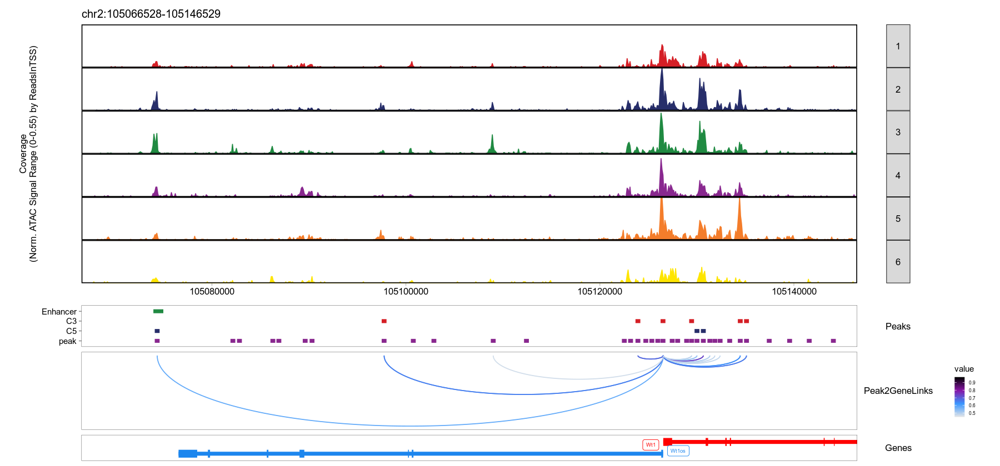

In [23]:
# Plot Nr5a1 fetal enhancer
Wt1 <- plotBrowserTrack(
    ArchRProj = Merged.proj2, 
    groupBy = "cluster", 
        geneSymbol = "Wt1", 
    
features = GRangesList(Enhancer = GRanges(c("chr2:105073942-105074968")),
    C3 = p2g.heatmap.addtss.df  %>% dplyr::filter(gene == "Wt1") %>% 
    filter(cluster == "3") %>%
    dplyr::select(peak) %>% separate(peak,c("chr","start","end")) %>% GRanges,
                       C5 = p2g.heatmap.addtss.df  %>% dplyr::filter(gene == "Wt1") %>% 
    filter(cluster == "5") %>%
    dplyr::select(peak) %>% separate(peak,c("chr","start","end")) %>% GRanges,
#                        TrackB = ("chr2:105120673-105132509"),
    peak =getPeakSet(Merged.proj2)
                      ),
    upstream = 60000,
    downstream = 20000,
         tileSize = 100,
    loops = getPeak2GeneLinks(Merged.proj2,
                              corCutOff = 0.45,
#        FDRCutOff = 0.05,resolution = 1
                             ),
        sizes = c(5, 0.8, 1.5, 0.5),

  log2Norm = TRUE,

  minCells = 50,
  normMethod = "ReadsInTSS",
  ylim = NULL,
  pal = NULL,
  baseSize = 10,
  scTileSize = 0.5,
  scCellsMax = 100,
  borderWidth =2,
  tickWidth = 0.2,
  facetbaseSize = 10,
    
)
options(repr.plot.width=15
       )
grid::grid.newpage()
grid::grid.draw(Wt1[[1]])

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-3dd669c85d6e-Date-2022-04-01_Time-09-41-38.log
If there is an issue, please report to github with logFile!

2022-04-01 09:41:39 : Validating Region, 0.007 mins elapsed.



GRanges object with 1 range and 2 metadata columns:
      seqnames            ranges strand |     gene_id      symbol
         <Rle>         <IRanges>  <Rle> | <character> <character>
  [1]     chr2 38692656-38714542      - |       26423       Nr5a1
  -------
  seqinfo: 21 sequences from mm10 genome


2022-04-01 09:41:39 : Adding Bulk Tracks (1 of 1), 0.008 mins elapsed.

Getting Region From Arrow Files 1 of 4

Getting Region From Arrow Files 2 of 4

Getting Region From Arrow Files 3 of 4

Getting Region From Arrow Files 4 of 4

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-04-01 09:41:40 : Adding Feature Tracks (1 of 1), 0.036 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-04-01 09:41:41 : Adding Loop Tracks (1 of 1), 0.04 mins elapsed.

2022-04-01 09:41:41 : Adding Gene Tracks (1 of 1), 0.045 mins elapsed.

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”
2022-04-01 09:41:41 : Plotting, 0.049 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotBrowserTrack-3dd669c85d6e-Date-2022-04-01_Time-09-41-38.log



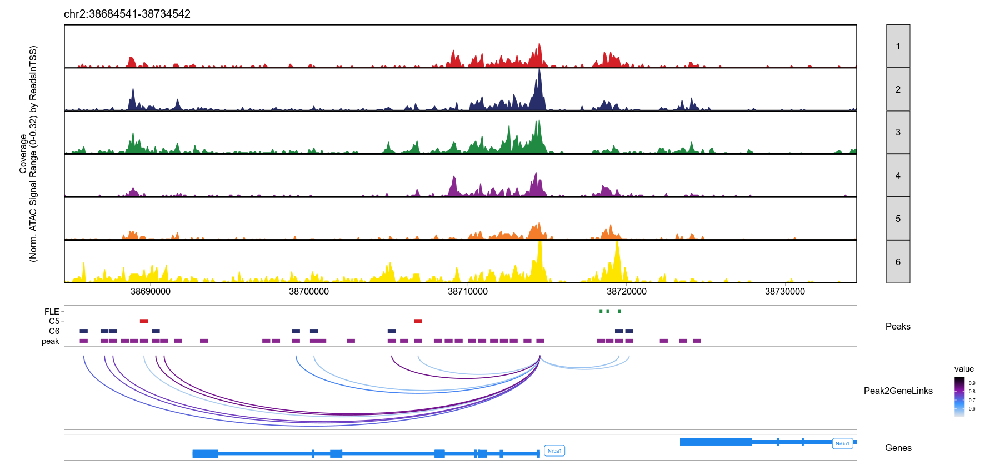

In [24]:
# Plot Nr5a1 fetal enhancer
Nr5a1 <- plotBrowserTrack(
    ArchRProj = Merged.proj2, 
    groupBy = "cluster", 
        geneSymbol = "Nr5a1", 
    
features = GRangesList(FLE = GRanges(c("chr2:38719462-38719662","chr2:38718737-38718888","chr2:38718304-38718479")),C5 = p2g.heatmap.addtss.df  %>% dplyr::filter(gene == "Nr5a1") %>% 
    filter(cluster == "5") %>%
    dplyr::select(peak) %>% separate(peak,c("chr","start","end")) %>% GRanges,
                       C6 = p2g.heatmap.addtss.df  %>% dplyr::filter(gene == "Nr5a1") %>% 
    filter(cluster == "6") %>%
    dplyr::select(peak) %>% separate(peak,c("chr","start","end")) %>% GRanges,
#                        TrackB = ("chr2:105120673-105132509"),
    peak =getPeakSet(Merged.proj2)),
    upstream = 30000,
    downstream = 20000,
         tileSize = 100,
    loops = getPeak2GeneLinks(Merged.proj2,
                              corCutOff = 0.5,
#        FDRCutOff = 0.05,resolution = 1
                             ),
         sizes = c(5, 0.8, 1.5, 0.5),

  log2Norm = TRUE,

  minCells = 50,
  normMethod = "ReadsInTSS",
  ylim = NULL,
  pal = NULL,
  baseSize = 10,
  scTileSize = 0.5,
  scCellsMax = 100,
  borderWidth =2,
  tickWidth = 0.2,
  facetbaseSize = 10,
    
)
options(repr.plot.width=15
       )
grid::grid.newpage()
grid::grid.draw(Nr5a1[[1]])

In [26]:
pdf("./2022Figure/Wt1.Nr5a1.P2g.browser.pdf",width=20,height=5)
library(cowplot)

library(colorspace)
plot_grid(Wt1[[1]],Nr5a1[[1]])
# grid::grid.draw(p[[4]])
dev.off()

png 
  2

In [95]:
GRangesList(Enhancer = GRanges(c("chr11:112768961-112772121","chr11:112769652-112770944")),
           pseudotime = GRanges(c("chr11:112770416-112770916","chr11:112850000-112850500","chr11:112802772-112803272")))

GRangesList object of length 2:
$Enhancer
GRanges object with 2 ranges and 0 metadata columns:
      seqnames              ranges strand
         <Rle>           <IRanges>  <Rle>
  [1]    chr11 112768961-112772121      *
  [2]    chr11 112769652-112770944      *
  -------
  seqinfo: 1 sequence from an unspecified genome; no seqlengths

$pseudotime
GRanges object with 3 ranges and 0 metadata columns:
      seqnames              ranges strand
         <Rle>           <IRanges>  <Rle>
  [1]    chr11 112770416-112770916      *
  [2]    chr11 112850000-112850500      *
  [3]    chr11 112802772-112803272      *
  -------
  seqinfo: 1 sequence from an unspecified genome; no seqlengths


ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-54ab7fde0b44-Date-2022-10-16_Time-17-56-33.log
If there is an issue, please report to github with logFile!

2022-10-16 17:56:35 : Validating Region, 0.028 mins elapsed.



GRanges object with 1 range and 2 metadata columns:
      seqnames              ranges strand |     gene_id      symbol
         <Rle>           <IRanges>  <Rle> | <character> <character>
  [1]    chr11 112782210-112787757      + |       20682        Sox9
  -------
  seqinfo: 21 sequences from mm10 genome


2022-10-16 17:56:35 : Adding Bulk Tracks (1 of 1), 0.03 mins elapsed.

Getting Region From Arrow Files 1 of 4

Getting Region From Arrow Files 2 of 4

Getting Region From Arrow Files 3 of 4

Getting Region From Arrow Files 4 of 4

2022-10-16 17:56:49 : Adding Feature Tracks (1 of 1), 0.257 mins elapsed.

2022-10-16 17:56:49 : Adding Loop Tracks (1 of 1), 0.262 mins elapsed.

2022-10-16 17:56:49 : Adding Gene Tracks (1 of 1), 0.266 mins elapsed.

2022-10-16 17:56:49 : Plotting, 0.27 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotBrowserTrack-54ab7fde0b44-Date-2022-10-16_Time-17-56-33.log



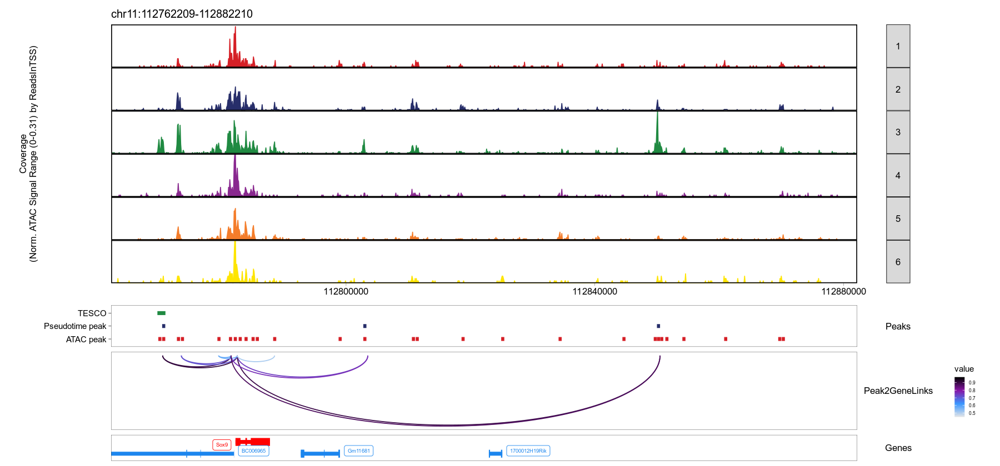

In [5]:

# Plot Sox9 p2g
Sox9 <- plotBrowserTrack(
    ArchRProj = Merged.proj2, 
    groupBy = "cluster", 
        geneSymbol = "Sox9", 

features = GRangesList(TESCO = GRanges(c("chr11:112769652-112770944")),
           "Pseudotime peak" = GRanges(c("chr11:112770416-112770916","chr11:112850000-112850500","chr11:112802772-112803272")),
    
#                        TrackB = ("chr2:105120673-105132509"),
    "ATAC peak" =getPeakSet(Merged.proj2)
                      ),
    upstream = 20000,
    downstream = 100000,
         tileSize = 100,
    loops = getPeak2GeneLinks(Merged.proj2,
                              corCutOff = 0.45,
#        FDRCutOff = 0.05,
                              resolution = 1000
                             ),
        sizes = c(5, 0.8, 1.5, 0.5),

  log2Norm = TRUE,

  minCells = 50,
  normMethod = "ReadsInTSS",
  ylim = NULL,
  pal = NULL,
  baseSize = 10,
  scTileSize = 0.5,
  scCellsMax = 100,
  borderWidth =2,
  tickWidth = 0.2,
  facetbaseSize = 10,
    
)
options(repr.plot.width=15
       )
grid::grid.newpage()
grid::grid.draw(Sox9[[1]])

In [6]:
pdf("./2022Figure/Sox9.browser.pdf",width=15)
options(repr.plot.width=15
       )
grid::grid.newpage()
grid::grid.draw(Sox9[[1]])
dev.off()

png 
  2